In [1]:
import os
import tempfile

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams
from matplotlib import cm, colors
import scanpy as sc
import pandas as pd
import seaborn as sb
import scipy as sp
import numpy as np
import torch
from rich import print


# Define the path to the directory you want to change to
new_directory = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single'

# Use os.chdir() to change the working directory
os.chdir(new_directory)

In [2]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams
from matplotlib import cm, colors

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [4]:
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=12) #color_map=mymap2)
sc.settings.figdir = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single/figures_all/'
sc.logging.print_header()

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


# Figures for scVI human_ALL cell types

In [38]:
adata_all = sc.read_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/scVI_human_allgenes_WORKING.h5ad')
adata_all

AnnData object with n_obs × n_vars = 321566 × 29040
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC

# ANNOTATION FOR ALL

In [9]:
adata_all.obs[:5]

,sample_id,publication,sample_id_anon,individual_id_anon,replicate,treatment,condition,tissue,time,batch,...,VLMCs,VECV,scVI_leiden_0.5,scVI_leiden_1,cluster_annotation,cell_leiden_annotated,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,refined_cluster_annotation
Ind98-Sample2:AAACCCATCCGTCAAA-1,Human_MS,Macnair et al. biorxiv,Ind98-Sample2,Ind98,1,MS_patient,MS,White matter,34,31,...,-0.015,-0.040201,1,1,MOLs,1_MOLs,28.619111,3.388420,1.058036,MOL3
Ind98-Sample2:AAACCCATCCTGGTCT-1,Human_MS,Macnair et al. biorxiv,Ind98-Sample2,Ind98,1,MS_patient,MS,White matter,34,31,...,0.000,-0.010050,2,3,Microglia,3_Microglia,17.697454,2.928387,1.021766,Microglia_B
Ind98-Sample2:AAACGAAGTTGTACGT-1,Human_MS,Macnair et al. biorxiv,Ind98-Sample2,Ind98,1,MS_patient,MS,White matter,34,31,...,-0.025,-0.120603,4,7,MOLs,7_MOLs,11.204287,2.501787,0.330501,MOL3
Ind98-Sample2:AAACGCTAGCGTATGG-1,Human_MS,Macnair et al. biorxiv,Ind98-Sample2,Ind98,1,MS_patient,MS,White matter,34,31,...,-0.015,-0.025126,3,9,Astrocytes,9_Astrocytes,18.327815,2.961545,0.801361,Astro_A
Ind98-Sample2:AAACGCTCAGTTGGTT-1,Human_MS,Macnair et al. biorxiv,Ind98-Sample2,Ind98,1,MS_patient,MS,White matter,34,31,...,0.000,-0.010050,0,2,MOLs,2_MOLs,28.825822,3.395375,2.225623,MOL2


In [5]:
cluster_1_annotation = {
    '0': 'MOLs',
    '1': 'MOLs',
    '2': 'MOLs',
    '3': 'Microglia',
    '4': 'Astrocytes',
    '5': 'MOLs',
    '6': 'MOLs',
    '7': 'MOLs',
    '8': 'OPCs + COPs',
    '9': 'Astrocytes',
    '10': 'Excitatory neurons',
    '11': 'Excitatory neurons',
    '12': 'Endo + Peri',
    '13': 'Microglia',
    '14': 'Excitatory neurons',
    '15': 'Mixed',
    '16': 'Inhibitory neurons',
    '17': 'Inhibitory neurons',
    '18': 'Excitatory neurons',
    '19': 'Astrocytes',
    '20': 'T cells',
    '21': 'Astrocytes',
    '22': 'Excitatory neurons',
    '23': 'Endo + Peri',
    '24': 'B cells',
    '25': 'Inhibitory neurons',
    '26': 'Excitatory neurons',
    '27': 'Astrocytes',
    '28': 'OPCs + COPs'
}

adata_all.obs['cluster_annotation'] = adata_all.obs['scVI_leiden_1'].map(cluster_1_annotation).astype('category')

In [5]:
# Unique values in the 'condition' column
unique_conditions = adata_all.obs['cluster_annotation'].unique()
for condition in unique_conditions:
    print(condition)

MOLs

Microglia

Astrocytes

Endo + Peri

Inhibitory neurons

Excitatory neurons

OPCs + COPs

T cells

Mixed

B cells

In [ ]:
    'Microglia': '#2d2dd9',
    'MOLs': '#cc0066',
    'BAMs': '#85b9ff',
    'OPCs': '#ffb3db',
    'COPs': '#cc6699',
    'Microglia/MOL mix': '#33cc00',
    'NPCs': '#fae14f',
    'Excitatory neurons': '#ff6600',
    'Astrocytes': '#006666',
    'Endothelial cells': '#ffbd14',
    'Pericytes': '#cc99ff',
    'Choroid plexus': '#b9722d',
    'Inhibitory neurons': '#ff9966',
    'Ependymal cells': '#990033',
    'NKT/T cells': '#9900cc',
    'VLMCs': '#d2d279',
    'VSMCs': '#79d2d2'

## MOUSE COLORS

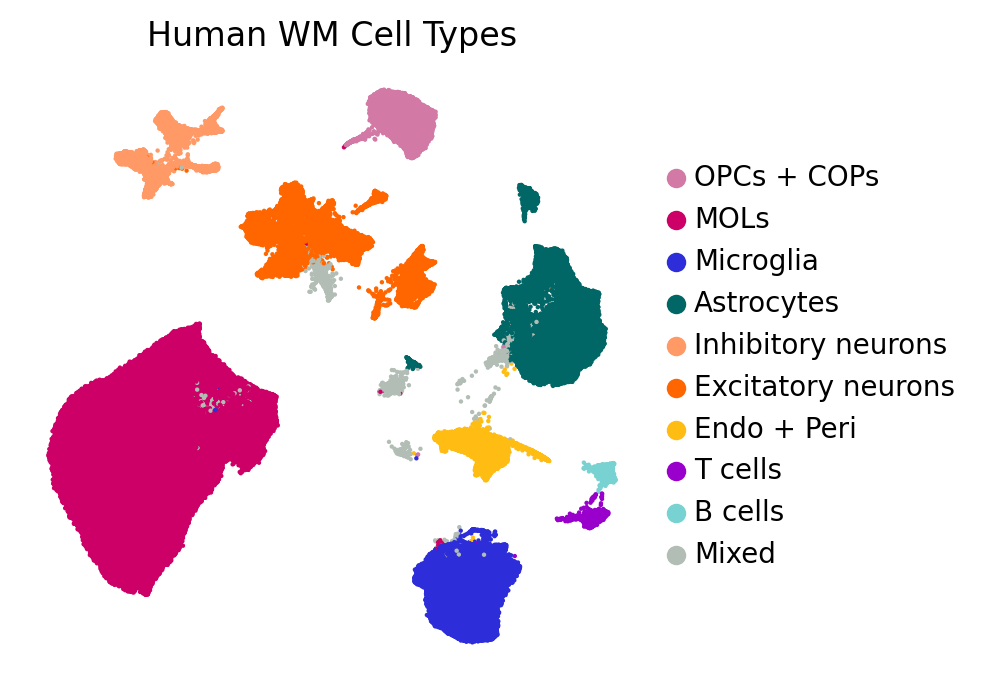

In [8]:
cluster_simplified_color = {
    'OPCs + COPs': '#d279a6',
    'MOLs': '#cc0066',
    'Microglia': '#2d2dd9',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffbd14',
    'T cells': '#9900cc',
    'B cells': '#79d2d2',
    'Mixed': '#b2beb5'
}

# Define the order of cell types
cell_type_order = ['OPCs + COPs', 'MOLs', 'Microglia', 'Astrocytes', 'Inhibitory neurons', 
                   'Excitatory neurons', 'Endo + Peri', 'T cells', 'B cells', 'Mixed']

# Reorder the cell types
adata_all.obs['cluster_annotation'] = pd.Categorical(adata_all.obs['cluster_annotation'], 
                                                     categories=cell_type_order, ordered=True)

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['cluster_annotation'], legend_fontsize =float(10) , wspace=0.6, 
           palette=cluster_simplified_color,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=10,
           title='Human WM Cell Types',
           save='_Human_scVI_ALL_integration_cell_types.png')           

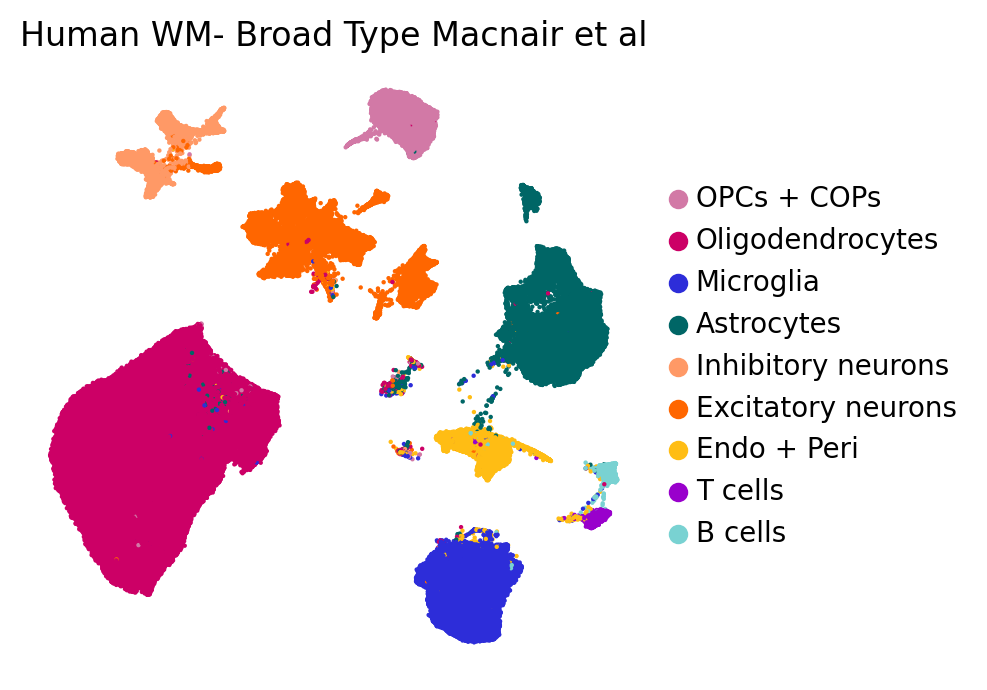

In [19]:
cluster_color = {
    'OPCs + COPs': '#d279a6',
    'Oligodendrocytes': '#cc0066',
    'Microglia': '#2d2dd9',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffbd14',
    'T cells': '#9900cc',
    'B cells': '#79d2d2'
}

# Define the order of cell types
cell_type_order = ['OPCs + COPs', 'Oligodendrocytes', 'Microglia', 'Astrocytes', 'Inhibitory neurons', 
                   'Excitatory neurons', 'Endo + Peri', 'T cells', 'B cells']

# Reorder the cell types
adata_all.obs['type_broad'] = pd.Categorical(adata_all.obs['type_broad'], 
                                                     categories=cell_type_order, ordered=True)

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['type_broad'], legend_fontsize =float(10) , wspace=0.6, 
           palette=cluster_color,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=10,
           title='Human WM- Broad Type Macnair et al',
           save='_Human_scVI_ALL_integration_broad_types_Mcnair.png') 

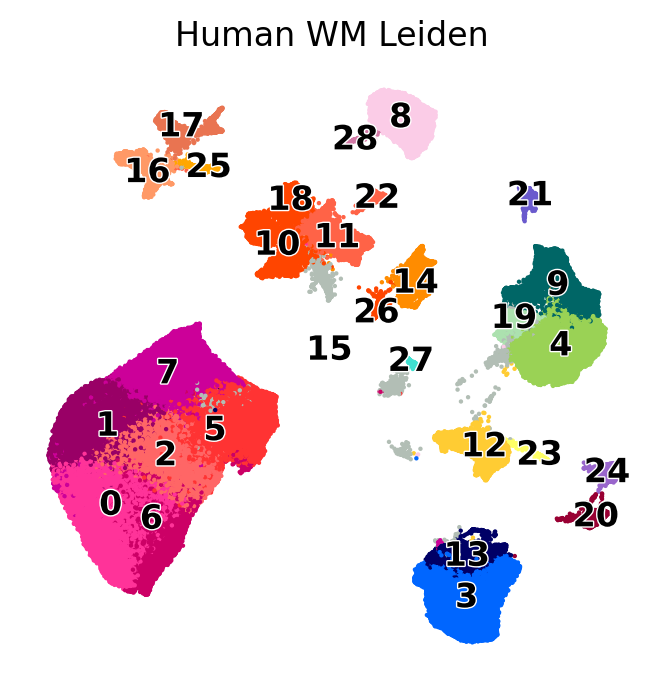

In [5]:
cluster_1_annotation_new = {
    '0': '#ff3399',
    '1': '#990066',
    '2': '#ff6666',
    '3': '#0066ff',
    '4': '#9AD255',
    '5': '#ff3333',
    '6': '#cc0066',
    '7': '#cc0099',
    '8': '#fbcce7',
    '9': '#006666',
    '10': '#FF4500',  # Excitatory - dark orange
    '11': '#FF6347',  # Excitatory - tomato red
    '12': '#ffcc33',
    '13': '#000066',
    '14': '#FF8C00',  # Excitatory - dark orange
    '15': '#b2beb5',
    '16': '#ff9966',  # Inhibitory - dark magenta
    '17': '#e97451',  # Inhibitory - medium orchid
    '18': '#FF4500',  # Excitatory - dark orange
    '19': '#ace1af',  # Astrocytes - steel blue
    '20': '#990033',
    '21': '#6A5ACD',  # Astrocytes - slate blue
    '22': '#FF6347',  # Excitatory - tomato red
    '23': '#ffff66',
    '24': '#9966cc',
    '25': '#ffa700',  # Inhibitory - orchid
    '26': '#FF4500',  # Excitatory - dark orange
    '27': '#40E0D0',  # Astrocytes - turquoise
    '28': '#d279a6'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['scVI_leiden_1'], legend_fontsize =float(12) , wspace=0.6,
           palette=cluster_1_annotation_new,legend_loc='on data',
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=10, 
           title='Human WM Leiden',
           save='_Human_scVI_ALL_integration_leiden.png')

In [9]:
cluster2annotation = {
    '0': '0_MOLs',
    '1': '1_MOLs',
    '2': '2_MOLs',
    '3': '3_Microglia',
    '4': '4_Astrocytes',
    '5': '5_MOLs',
    '6': '6_MOLs',
    '7': '7_MOLs',
    '8': '8_OPCs + COPs',
    '9': '9_Astrocytes',
    '10': '10_Excitatory neurons',
    '11': '11_Excitatory neurons',
    '12': '12_Endo + Peri',
    '13': '13_Microglia',
    '14': '14_Excitatory neurons',
    '15': '15_Mixed',
    '16': '16_Inhibitory neurons',
    '17': '17_Inhibitory neurons',
    '18': '18_Excitatory neurons',
    '19': '19_Astrocytes',
    '20': '20_T cells',
    '21': '21_Astrocytes',
    '22': '22_Excitatory neurons',
    '23': '23_Endo + Peri',
    '24': '24_B cells',
    '25': '25_Inhibitory neurons',
    '26': '26_Excitatory neurons',
    '27': '27_Astrocytes',
    '28': '28_OPCs + COPs'
}

adata_all.obs['cell_leiden_annotated'] = adata_all.obs['scVI_leiden_1'].map(cluster2annotation).astype('category')

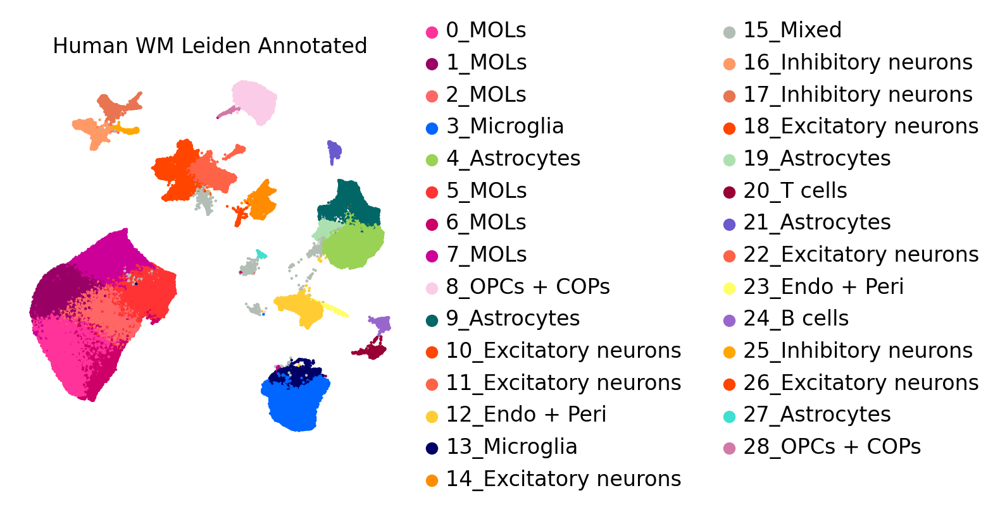

In [22]:
cluster2annotation = {
    '0_MOLs': '#ff3399',
    '1_MOLs': '#990066',
    '2_MOLs': '#ff6666',
    '3_Microglia': '#0066ff',
    '4_Astrocytes': '#9AD255',
    '5_MOLs': '#ff3333',
    '6_MOLs': '#cc0066',
    '7_MOLs': '#cc0099',
    '8_OPCs + COPs': '#fbcce7',
    '9_Astrocytes': '#006666',
    '10_Excitatory neurons': '#FF4500',
    '11_Excitatory neurons': '#FF6347',
    '12_Endo + Peri': '#ffcc33',
    '13_Microglia': '#000066',
    '14_Excitatory neurons': '#FF8C00',
    '15_Mixed': '#b2beb5',
    '16_Inhibitory neurons': '#ff9966',
    '17_Inhibitory neurons': '#e97451',
    '18_Excitatory neurons': '#FF4500',
    '19_Astrocytes': '#ace1af',
    '20_T cells': '#990033',
    '21_Astrocytes': '#6A5ACD',
    '22_Excitatory neurons': '#FF6347',
    '23_Endo + Peri': '#ffff66',
    '24_B cells': '#9966cc',
    '25_Inhibitory neurons': '#ffa700',
    '26_Excitatory neurons': '#FF4500',
    '27_Astrocytes': '#40E0D0',
    '28_OPCs + COPs': '#d279a6'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['cell_leiden_annotated'], legend_fontsize =float(12) , wspace=0.6,
           palette=cluster2annotation,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=10,
           title='Human WM Leiden Annotated',
           save='_Human_scVI_ALL_integration_leiden_annotated.png')

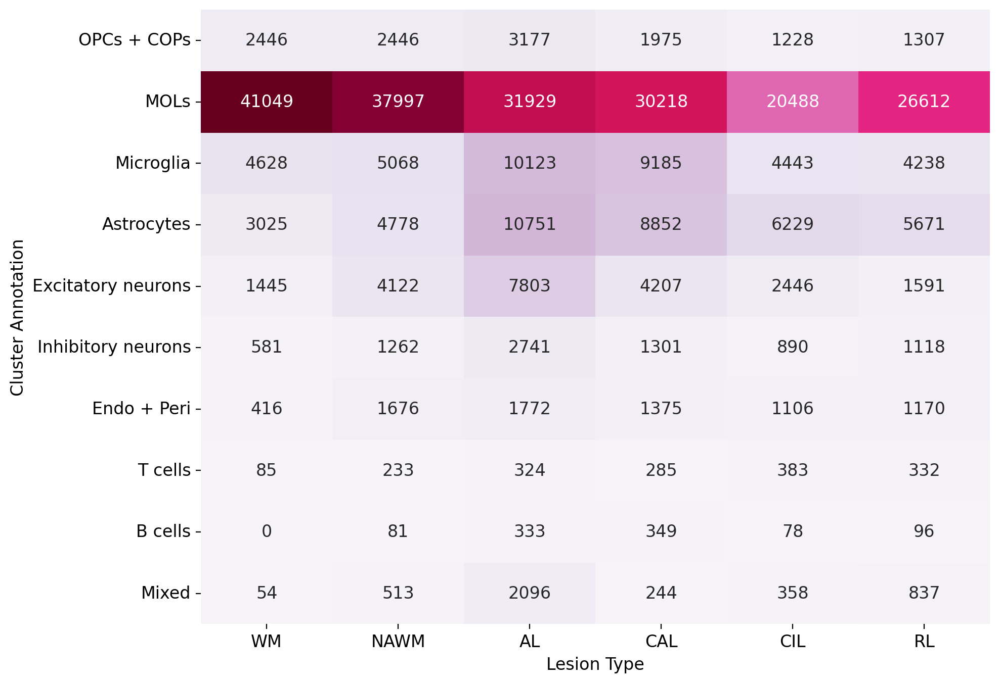

In [5]:
###mamba env- 

# Define the order for lesion_type
lesion_order = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']

# Convert the lesion_type column to a categorical type with the specified order
adata_all.obs['lesion_type'] = pd.Categorical(adata_all.obs['lesion_type'], categories=lesion_order, ordered=True)

# Create the crosstab
crosstab_df = pd.crosstab(adata_all.obs['cluster_annotation'], adata_all.obs['lesion_type'])

# Plot with seaborn
plt.figure(figsize=(10, 8))
ax = sb.heatmap(crosstab_df, annot=True, fmt="d", cmap="PuRd", cbar=False)
plt.xlabel('Lesion Type')
plt.ylabel('Cluster Annotation')

# Remove the grid lines
ax.grid(False)

# Remove the frame of the plot on the top and right side
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.savefig('./figures_all/crosstab_celltype_count_vs_lesion.png')

plt.show()

In [10]:
# Unique values in the 'condition' column
unique_conditions = adata_all.obs['cluster_annotation'].unique()
for condition in unique_conditions:
    print(condition)

MOLs

Microglia

Astrocytes

Endo + Peri

Inhibitory neurons

Excitatory neurons

OPCs + COPs

T cells

Mixed

B cells

In [14]:
# Select the columns you want to export from .obs
metadata_columns = [
    'sample_id_anon', 'individual_id_anon', 'lesion_type', 'sample_source',
    'diagnosis', 'seq_pool', 'sex', 'age_at_death', 'cause_of_death', 'pmi_minutes', 'age_cat', 'pmi_cat'
]

# Check if all columns exist in the .obs
missing_columns = [col for col in metadata_columns if col not in adata_all.obs.columns]
if missing_columns:
    print(f"Warning: The following columns are missing in adata_all.obs: {missing_columns}")
else:
    # Create a DataFrame with the selected columns
    metadata_df = adata_all.obs[metadata_columns]

    # Remove duplicate entries based on `sample_id_anon`
    metadata_df = metadata_df.drop_duplicates(subset='sample_id_anon')

    # Save the DataFrame to a CSV file
    output_path = "./figures_all/metadata_columns.csv"
    metadata_df.to_csv(output_path, index=False)

    print(f"Metadata columns successfully saved to {output_path} with duplicates removed based on `sample_id_anon`.")

Metadata columns successfully saved to ./figures_all/metadata_columns.csv with duplicates removed based on 
`sample_id_anon`.

In [12]:
# Crosstab: cluster_annotation vs lesion_type
crosstab_df_lesion = pd.crosstab(adata_all.obs['cluster_annotation'], adata_all.obs['lesion_type'])

# Save to CSV
output_path_lesion = "./figures_all/crosstab_cluster_vs_lesion_type.csv"
crosstab_df_lesion.to_csv(output_path_lesion)

print(f"Crosstab for 'cluster_annotation' vs 'lesion_type' saved to {output_path_lesion}")

Crosstab for 'cluster_annotation' vs 'lesion_type' saved to ./figures_all/crosstab_cluster_vs_lesion_type.csv

In [13]:
# Crosstab: cluster_annotation vs sample_id_anon
crosstab_df_sample = pd.crosstab(adata_all.obs['cluster_annotation'], adata_all.obs['sample_id_anon'])

# Save to CSV
output_path_sample = "./figures_all/crosstab_cluster_vs_sample_id_anon.csv"
crosstab_df_sample.to_csv(output_path_sample)

print(f"Crosstab for 'cluster_annotation' vs 'sample_id_anon' saved to {output_path_sample}")

Crosstab for 'cluster_annotation' vs 'sample_id_anon' saved to ./figures_all/crosstab_cluster_vs_sample_id_anon.csv

In [16]:
# Count the number of unique entries for WM in the lesion_type column
wm_count = metadata_df.loc[metadata_df['lesion_type'] == 'WM', 'sample_id_anon'].nunique()

# Count the number of unique entries for NAWM in the lesion_type column
nawm_count = metadata_df.loc[metadata_df['lesion_type'] == 'NAWM', 'sample_id_anon'].nunique()

# Count the number of unique entries for NAWM in the lesion_type column
al_count = metadata_df.loc[metadata_df['lesion_type'] == 'AL', 'sample_id_anon'].nunique()

# Count the number of unique entries for NAWM in the lesion_type column
cal_count = metadata_df.loc[metadata_df['lesion_type'] == 'CAL', 'sample_id_anon'].nunique()

# Count the number of unique entries for NAWM in the lesion_type column
cil_count = metadata_df.loc[metadata_df['lesion_type'] == 'CIL', 'sample_id_anon'].nunique()

# Count the number of unique entries for NAWM in the lesion_type column
rl_count = metadata_df.loc[metadata_df['lesion_type'] == 'RL', 'sample_id_anon'].nunique()

print(f"Number of unique WM entries: {wm_count}")
print(f"Number of unique NAWM entries: {nawm_count}")
print(f"Number of unique NAWM entries: {al_count}")
print(f"Number of unique NAWM entries: {cal_count}")
print(f"Number of unique NAWM entries: {cil_count}")
print(f"Number of unique NAWM entries: {rl_count}")

Number of unique WM entries: 13

Number of unique NAWM entries: 17

Number of unique NAWM entries: 21

Number of unique NAWM entries: 17

Number of unique NAWM entries: 13

Number of unique NAWM entries: 11

In [17]:
# Count the number of unique individual_id_anon entries
unique_individuals_count = metadata_df['individual_id_anon'].nunique()

print(f"Number of unique individual_id_anon entries: {unique_individuals_count}")

Number of unique individual_id_anon entries: 47

# Redo barchart

In [18]:
pd.set_option('display.max_columns', None)

In [19]:
# Identify donors with multiple unique sample IDs
adata_df = adata_all.obs.copy()

# Identify donors with multiple unique sample IDs
donor_sample_counts = adata_df.groupby('individual_id_anon')['sample_id_anon'].nunique()
print(len(donor_sample_counts))
donor_sample_counts

/tmp/1064779.1.gpu/ipykernel_36515/2430370881.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  donor_sample_counts = adata_df.groupby('individual_id_anon')['sample_id_anon'].nunique()


47

individual_id_anon
Ind86     1
Ind98     1
Ind101    4
Ind102    4
Ind103    1
Ind104    3
Ind105    1
Ind106    2
Ind107    1
Ind108    6
Ind109    3
Ind110    1
Ind111    1
Ind112    2
Ind113    3
Ind114    3
Ind115    2
Ind116    3
Ind117    1
Ind118    4
Ind119    1
Ind120    2
Ind121    1
Ind122    2
Ind123    3
Ind124    1
Ind125    1
Ind126    1
Ind127    5
Ind128    1
Ind130    5
Ind131    1
Ind132    2
Ind133    1
Ind134    4
Ind135    1
Ind136    1
Ind137    1
Ind139    1
Ind140    1
Ind141    2
Ind142    2
Ind143    1
Ind144    1
Ind145    1
Ind146    1
Ind147    1
Name: sample_id_anon, dtype: int64

In [20]:
# Count number of unique samples per lesion type for each individual
sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')

# Pivot the table to have one row per individual and columns for each lesion_type
pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)

# Fill missing lesion types with 0
pivoted_counts = pivoted_counts.fillna(0)

# Display the resulting table
pivoted_counts.head()

/tmp/1064779.1.gpu/ipykernel_36515/668022987.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')
/tmp/1064779.1.gpu/ipykernel_36515/668022987.py:5: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)


lesion_type,WM,NAWM,AL,CAL,CIL,RL
individual_id_anon,,,,,,
Ind86,1.0,0.0,0.0,0.0,0.0,0.0
Ind98,1.0,0.0,0.0,0.0,0.0,0.0
Ind101,0.0,1.0,0.0,0.0,2.0,1.0
Ind102,0.0,0.0,1.0,2.0,1.0,0.0
Ind103,0.0,0.0,1.0,0.0,0.0,0.0


In [25]:
# Calculate the sum of all columns
column_sums = pivoted_counts.sum(axis=0)

# Display the results
print("Column sums (total samples per lesion type):")
print(column_sums)

Column sums (total samples per lesion type):

lesion_type
WM               13.0
NAWM             17.0
AL               21.0
CAL              17.0
CIL              13.0
RL               11.0
total_samples    92.0
dtype: float64

/tmp/1064779.1.gpu/ipykernel_36515/649003620.py:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)


<Figure size 1200x800 with 0 Axes>

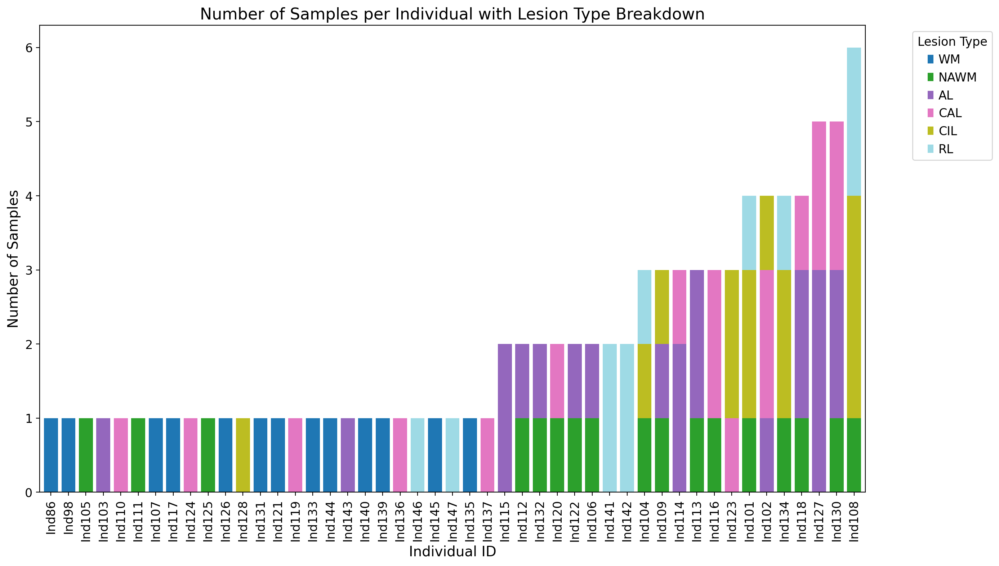

In [22]:
# Pivot the table for plotting
pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)

# Sort individuals by the number of samples
pivoted_counts['total_samples'] = pivoted_counts.sum(axis=1)
pivoted_counts = pivoted_counts.sort_values(by='total_samples')

# Plot
plt.figure(figsize=(12, 8))
ax = pivoted_counts.drop('total_samples', axis=1).plot(kind='bar', stacked=True, figsize=(14, 8), width=0.8, colormap='tab20')

# Customize the plot
plt.title('Number of Samples per Individual with Lesion Type Breakdown', fontsize=16)
plt.xlabel('Individual ID', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Lesion Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.grid(False)  # Remove grid lines

plt.tight_layout()
plt.show()

In [28]:
# Count number of unique samples per lesion type for each individual
sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')

# Pivot the table to have one row per individual and columns for each lesion_type
pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)

# Fill missing lesion types with 0
pivoted_counts = pivoted_counts.fillna(0)

# Calculate total samples per individual
pivoted_counts['total_samples'] = pivoted_counts.sum(axis=1)

# Sort individuals by the number of samples
pivoted_counts_sorted = pivoted_counts.sort_values(by='total_samples')

# Specify the desired lesion type order
desired_treatments_order = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']

# Reorder columns based on the desired treatment order and ensure 'total_samples' is retained
pivoted_counts_reordered = pivoted_counts_sorted[desired_treatments_order + ['total_samples']]

# Ensure DataFrame is sorted by total_samples and maintain correct order
pivoted_counts_reordered = pivoted_counts_reordered.sort_values(by='total_samples')

# Drop the total_samples column for plotting
pivoted_counts_plot = pivoted_counts_reordered.drop(columns=['total_samples'])

# Calculate the sum of all columns
column_sums = pivoted_counts_plot.sum(axis=0)

# Display the results
print("Column sums (total samples per lesion type):")
print(column_sums)

/tmp/1064779.1.gpu/ipykernel_36515/4055703514.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')
/tmp/1064779.1.gpu/ipykernel_36515/4055703514.py:5: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)


Column sums (total samples per lesion type):

lesion_type
WM      13.0
NAWM    17.0
AL      21.0
CAL     17.0
CIL     13.0
RL      11.0
dtype: float64

In [30]:
# Define the desired order of individuals
individual_order = [
    'Ind86', 'Ind117', 'Ind107', 'Ind98', 'Ind121', 'Ind145', 'Ind144', 'Ind139', 'Ind135', 'Ind133', 'Ind131', 'Ind126', 'Ind140',
    'Ind105', 'Ind111', 'Ind125',
    'Ind103', 'Ind143',
    'Ind110', 'Ind119', 'Ind137', 'Ind136', 'Ind124',
    'Ind128',
    'Ind147', 'Ind146',
    'Ind112', 'Ind122', 'Ind132', 'Ind106', 'Ind120', 'Ind115', 'Ind141', 'Ind142',
    'Ind113', 'Ind109', 'Ind116', 'Ind104', 'Ind114', 'Ind123',
    'Ind118', 'Ind101', 'Ind134', 'Ind102',
    'Ind130', 'Ind127', 'Ind108'
]

# Count number of unique samples per lesion type for each individual
sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')

# Pivot the table to have one row per individual and columns for each lesion_type
pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)

# Fill missing lesion types with 0
pivoted_counts = pivoted_counts.fillna(0)

# Calculate total samples per individual
pivoted_counts['total_samples'] = pivoted_counts.sum(axis=1)

# Reorder the DataFrame based on the specific order of individual IDs
pivoted_counts_reordered = pivoted_counts.loc[individual_order]

# Drop the total_samples column for plotting
pivoted_counts_plot = pivoted_counts_reordered.drop(columns=['total_samples'])

# Calculate the sum of all columns
column_sums = pivoted_counts_plot.sum(axis=0)

# Display the results
print("Column sums (total samples per lesion type):")
print(column_sums)

/tmp/1064779.1.gpu/ipykernel_36515/1068040392.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')
/tmp/1064779.1.gpu/ipykernel_36515/1068040392.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)


Column sums (total samples per lesion type):

lesion_type
WM      13.0
NAWM    17.0
AL      21.0
CAL     17.0
CIL     13.0
RL      11.0
dtype: float64

<Figure size 1200x800 with 0 Axes>

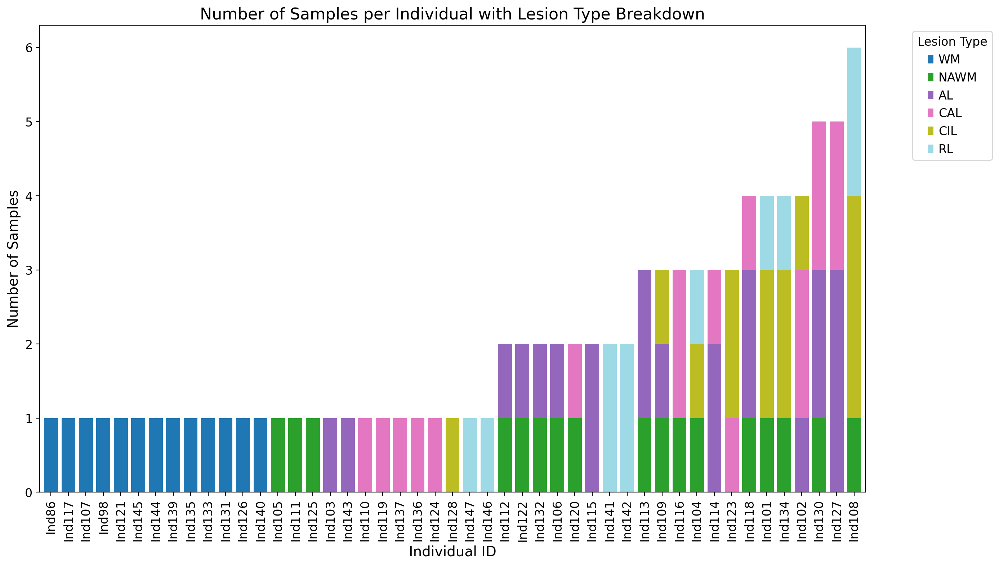

In [31]:
# Plot
plt.figure(figsize=(12, 8))
ax = pivoted_counts_plot.plot(kind='bar', stacked=True, figsize=(14, 8), width=0.8, colormap='tab20')

# Customize the plot
plt.title('Number of Samples per Individual with Lesion Type Breakdown', fontsize=16)
plt.xlabel('Individual ID', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Lesion Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.grid(False)  # Remove grid lines

plt.tight_layout()
plt.show()

/tmp/1064779.1.gpu/ipykernel_36515/4162657873.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')
/tmp/1064779.1.gpu/ipykernel_36515/4162657873.py:15: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)


<Figure size 1200x800 with 0 Axes>

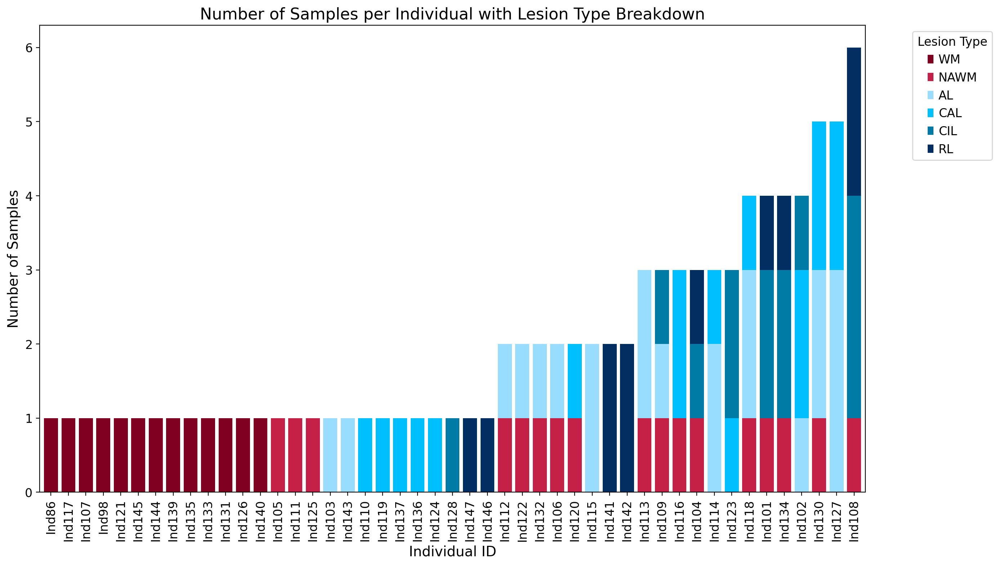

In [32]:
# Define the colors for each lesion type
colors = {
    'WM': '#800020',
    'NAWM': '#c32148',
    'AL': '#9bddff',
    'CAL': '#00bfff',
    'CIL': '#007aa5',
    'RL': '#002e63'
}

# Count number of unique samples per lesion type for each individual
sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')

# Pivot the table to have one row per individual and columns for each lesion_type
pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)

# Fill missing lesion types with 0
pivoted_counts = pivoted_counts.fillna(0)

# Calculate total samples per individual
pivoted_counts['total_samples'] = pivoted_counts.sum(axis=1)

# Reorder the DataFrame based on the specific order of individual IDs
pivoted_counts_reordered = pivoted_counts.loc[individual_order]

# Drop the total_samples column for plotting
pivoted_counts_plot = pivoted_counts_reordered.drop(columns=['total_samples'])

# Reorder lesion types for plotting
desired_treatments_order = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']
pivoted_counts_plot = pivoted_counts_plot[desired_treatments_order]

# Plot
plt.figure(figsize=(12, 8))
ax = pivoted_counts_plot.plot(kind='bar', stacked=True, figsize=(14, 8), width=0.8, color=[colors[col] for col in desired_treatments_order])

# Customize the plot
plt.title('Number of Samples per Individual with Lesion Type Breakdown', fontsize=16)
plt.xlabel('Individual ID', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.xticks(rotation=90)

# Customize legend
handles, labels = ax.get_legend_handles_labels()
ordered_labels = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']
handles = [handles[labels.index(label)] for label in ordered_labels]
plt.legend(handles=handles, labels=ordered_labels, title='Lesion Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.grid(False)  # Remove grid lines

plt.tight_layout()
plt.show()

In [35]:
import matplotlib.patheffects as path_effects

# Define the colors for each lesion type
colors = {
    'WM': '#800020',
    'NAWM': '#de3163',
    'AL': '#9bddff',
    'CAL': '#1e90ff',
    'CIL': '#273be2',
    'RL': '#191970'
}

# Define the desired order of individuals
individual_order = [
    'Ind86',
    'Ind105', 'Ind111', 'Ind125',
    'Ind103', 'Ind143',
    'Ind110', 'Ind119', 'Ind137', 'Ind136', 'Ind124',
    'Ind128',
    'Ind147', 'Ind146',
    'Ind112', 'Ind122', 'Ind132', 'Ind106', 'Ind120', 'Ind115', 'Ind141', 'Ind142',
    'Ind113', 'Ind109', 'Ind116', 'Ind104', 'Ind114', 'Ind123',
    'Ind118', 'Ind101', 'Ind134', 'Ind102',
    'Ind130', 'Ind127', 'Ind108'
]

# Define the diagnosis for each individual with simplified labels
individual_to_diagnosis = {
    'Ind86': 'Ctr',
    'Ind105': 'SP', 'Ind111': 'SP', 'Ind125': 'PP',
    'Ind103': 'RR', 'Ind143': 'PP', 'Ind110': 'SP', 'Ind119': 'PP',
    'Ind137': 'SP', 'Ind136': 'PP', 'Ind124': 'PP', 'Ind128': 'PP',
    'Ind147': 'SP', 'Ind146': 'PP', 'Ind112': 'PP', 'Ind122': 'PP',
    'Ind132': 'RR', 'Ind106': 'SP', 
    'Ind120': 'SP', 'Ind115': 'SP', 'Ind141': 'SP',
    'Ind142': 'SP', 'Ind113': 'SP', 'Ind109': 'SP', 'Ind116': 'PP',
    'Ind104': 'SP', 'Ind114': 'SP', 'Ind123': 'PP',
    'Ind118': 'PP', 'Ind101': 'SP',
    'Ind134': 'SP', 'Ind102': 'SP', 'Ind130': 'SP', 'Ind127': 'PP',
    'Ind108': 'SP'
}

# Define the color for each diagnosis
diagnosis_colors = {
    'Ctr': '#800020',
    'RR': '#9bddff',
    'SP': '#1e90ff',
    'PP': '#000f89',
}

# Count number of unique samples per lesion type for each individual
sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')

# Pivot the table to have one row per individual and columns for each lesion_type
pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)

# Fill missing lesion types with 0
pivoted_counts = pivoted_counts.fillna(0)

# Calculate total samples per individual
pivoted_counts['total_samples'] = pivoted_counts.sum(axis=1)

# Reorder the DataFrame based on the specific order of individual IDs
pivoted_counts_reordered = pivoted_counts.loc[individual_order]

# Drop the total_samples column for plotting
pivoted_counts_plot = pivoted_counts_reordered.drop(columns=['total_samples'])

# Reorder lesion types for plotting
desired_treatments_order = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']
pivoted_counts_plot = pivoted_counts_plot[desired_treatments_order]

# Calculate the sum of all columns
column_sums = pivoted_counts_plot.sum(axis=0)

# Display the results
print("Column sums (total samples per lesion type):")
print(column_sums)

/tmp/1064779.1.gpu/ipykernel_36515/1117617875.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')
/tmp/1064779.1.gpu/ipykernel_36515/1117617875.py:55: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)


Column sums (total samples per lesion type):

lesion_type
WM       1.0
NAWM    17.0
AL      21.0
CAL     17.0
CIL     13.0
RL      11.0
dtype: float64

/tmp/1064779.1.gpu/ipykernel_36515/2073381738.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')
/tmp/1064779.1.gpu/ipykernel_36515/2073381738.py:55: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)


<Figure size 1400x800 with 0 Axes>

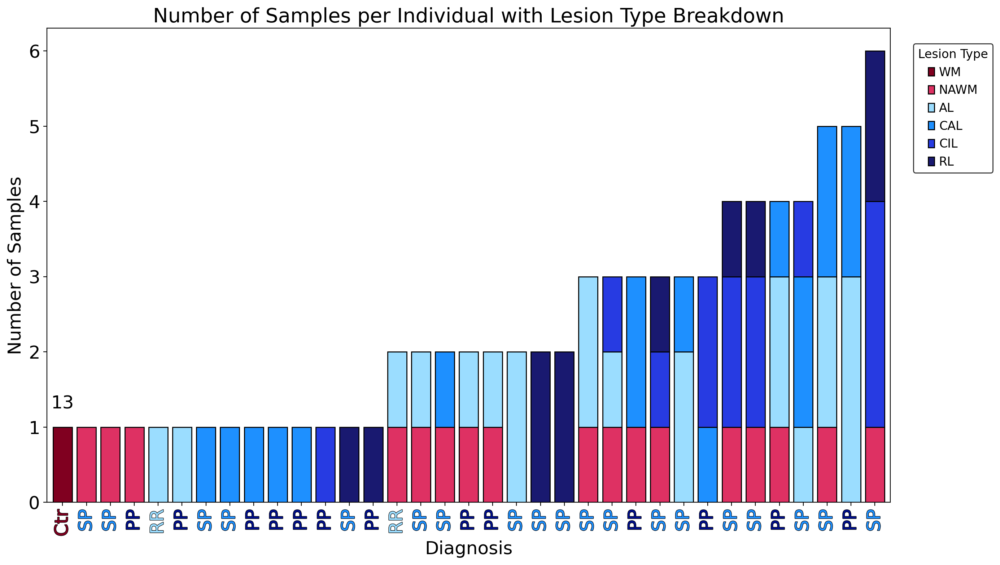

In [36]:
import matplotlib.patheffects as path_effects

# Define the colors for each lesion type
colors = {
    'WM': '#800020',
    'NAWM': '#de3163',
    'AL': '#9bddff',
    'CAL': '#1e90ff',
    'CIL': '#273be2',
    'RL': '#191970'
}

# Define the desired order of individuals
individual_order = [
    'Ind86',
    'Ind105', 'Ind111', 'Ind125',
    'Ind103', 'Ind143',
    'Ind110', 'Ind137', 'Ind119', 'Ind136', 'Ind124',
    'Ind128',
    'Ind147', 'Ind146',
    'Ind132', 'Ind106', 'Ind120', 'Ind112', 'Ind122', 'Ind115', 'Ind141', 'Ind142',
    'Ind113', 'Ind109', 'Ind116', 'Ind104', 'Ind114', 'Ind123',
    'Ind101', 'Ind134', 'Ind118', 'Ind102',
    'Ind130', 'Ind127', 'Ind108'
]

# Define the diagnosis for each individual with simplified labels
individual_to_diagnosis = {
    'Ind86': 'Ctr',
    'Ind105': 'SP', 'Ind111': 'SP', 'Ind125': 'PP', 'Ind103': 'RR', 'Ind143': 'PP', 
    'Ind110': 'SP', 'Ind137': 'SP', 'Ind119': 'PP', 'Ind136': 'PP', 'Ind124': 'PP', 
    'Ind128': 'PP','Ind147': 'SP', 'Ind146': 'PP', 
    'Ind132': 'RR', 'Ind106': 'SP', 'Ind120': 'SP', 'Ind112': 'PP', 'Ind122': 'PP',  
    'Ind115': 'SP', 'Ind141': 'SP','Ind142': 'SP', 
    'Ind113': 'SP', 'Ind109': 'SP', 'Ind116': 'PP',
    'Ind104': 'SP', 'Ind114': 'SP', 'Ind123': 'PP',
    
    'Ind101': 'SP', 'Ind134': 'SP', 'Ind118': 'PP', 'Ind102': 'SP', 
    'Ind130': 'SP', 'Ind127': 'PP',
    'Ind108': 'SP'
}

# Define the color for each diagnosis
diagnosis_colors = {
    'Ctr': '#800020',
    'RR': '#9bddff',
    'SP': '#1e90ff',
    'PP': '#000f89',
}

# Count number of unique samples per lesion type for each individual
sample_counts_per_individual = adata_df.groupby(['individual_id_anon', 'lesion_type'])['sample_id_anon'].nunique().reset_index(name='sample_count')

# Pivot the table to have one row per individual and columns for each lesion_type
pivoted_counts = sample_counts_per_individual.pivot_table(index='individual_id_anon', columns='lesion_type', values='sample_count', fill_value=0)

# Fill missing lesion types with 0
pivoted_counts = pivoted_counts.fillna(0)

# Calculate total samples per individual
pivoted_counts['total_samples'] = pivoted_counts.sum(axis=1)

# Reorder the DataFrame based on the specific order of individual IDs
pivoted_counts_reordered = pivoted_counts.loc[individual_order]

# Drop the total_samples column for plotting
pivoted_counts_plot = pivoted_counts_reordered.drop(columns=['total_samples'])

# Reorder lesion types for plotting
desired_treatments_order = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']
pivoted_counts_plot = pivoted_counts_plot[desired_treatments_order]

# Replace individual IDs with diagnosis labels
diagnosis_labels = [individual_to_diagnosis[ind] for ind in individual_order]

# Plot
plt.figure(figsize=(14, 8))
ax = pivoted_counts_plot.plot(kind='bar', stacked=True, figsize=(14, 8), width=0.8, color=[colors[col] for col in desired_treatments_order], edgecolor='black')

# Customize the plot
plt.title('Number of Samples per Individual with Lesion Type Breakdown', fontsize=20)
plt.xlabel('Diagnosis', fontsize=18)
plt.ylabel('Number of Samples', fontsize=18)
plt.yticks(fontsize=18)
plt.xticks(ticks=range(len(diagnosis_labels)), labels=diagnosis_labels, rotation=90, fontsize=18)

# Color x-axis labels with outline
for tick, label in zip(ax.get_xticks(), ax.get_xticklabels()):
    diagnosis = diagnosis_labels[int(tick)]
    label.set_color(diagnosis_colors.get(diagnosis, '#000000'))  # Default to black if diagnosis is not in the color map
    label.set_path_effects([
        path_effects.withStroke(linewidth=1, foreground='black'), 
        path_effects.Normal()
    ])
    
ax.text(0, 1 + 0.2, '13', ha='center', va='bottom', fontsize=18, color='black')

# Customize legend
handles, labels = ax.get_legend_handles_labels()
ordered_labels = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']
handles = [handles[labels.index(label)] for label in ordered_labels]
plt.legend(handles=handles, labels=ordered_labels, title='Lesion Type', bbox_to_anchor=(1.02, 0.98), loc='upper left', fontsize=12, frameon=True, edgecolor='black')

plt.grid(False)  # Remove grid lines

plt.savefig('./figures_all/Diagnosis_lesion_type_bySamples_stacked_barchart_simplified.png', bbox_inches='tight')

plt.tight_layout()
plt.show()

# Save if changed anything

In [11]:
adata_all.write_h5ad('./scVI_human_allgenes_WORKING.h5ad')

# individual plots

In [ ]:
# Unique values in the 'condition' column
unique_conditions = adata_all.obs['diagnosis'].unique()
for condition in unique_conditions:
    print(condition)

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


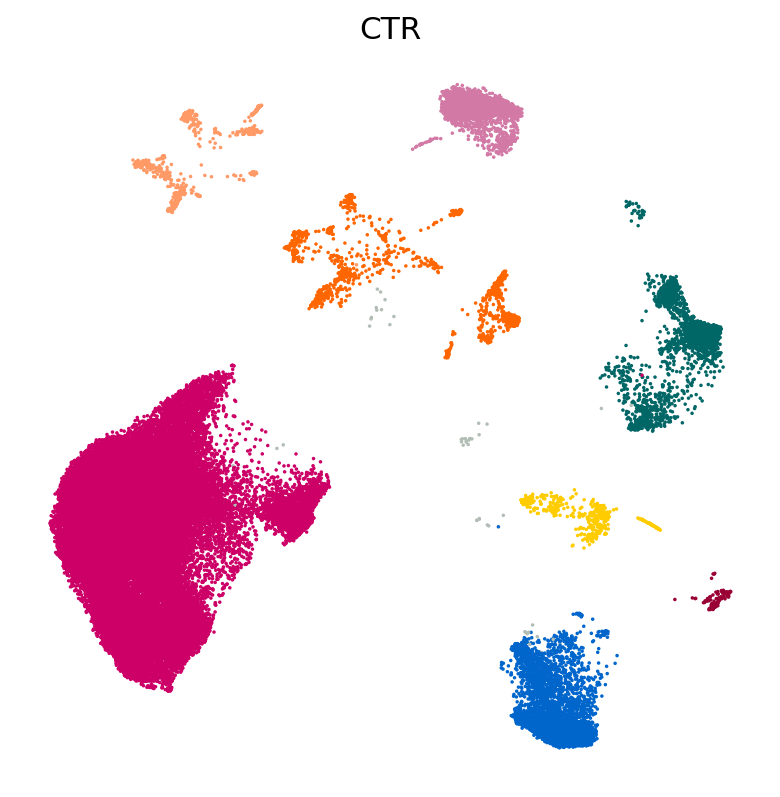

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


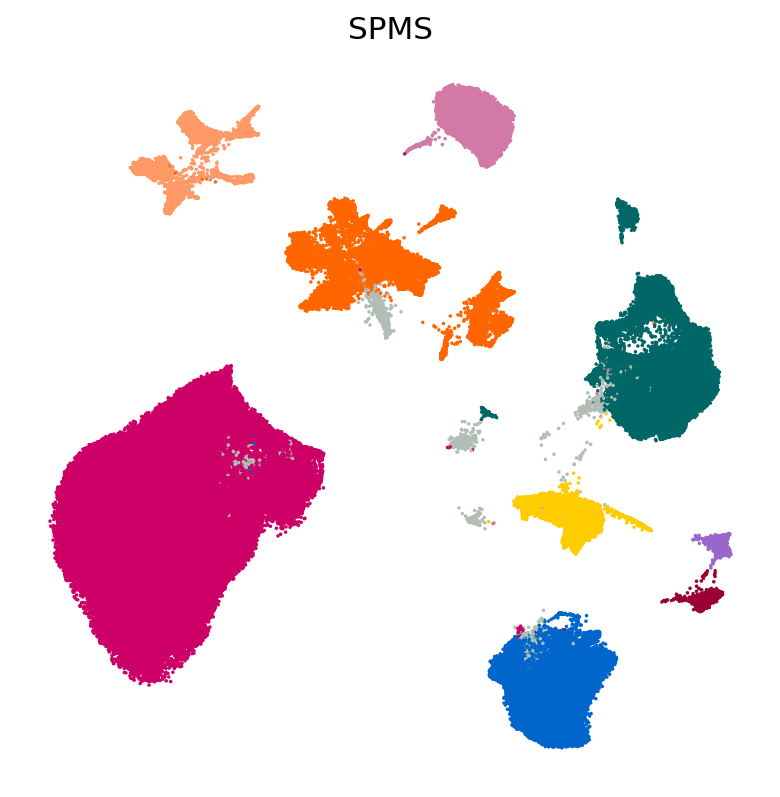

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


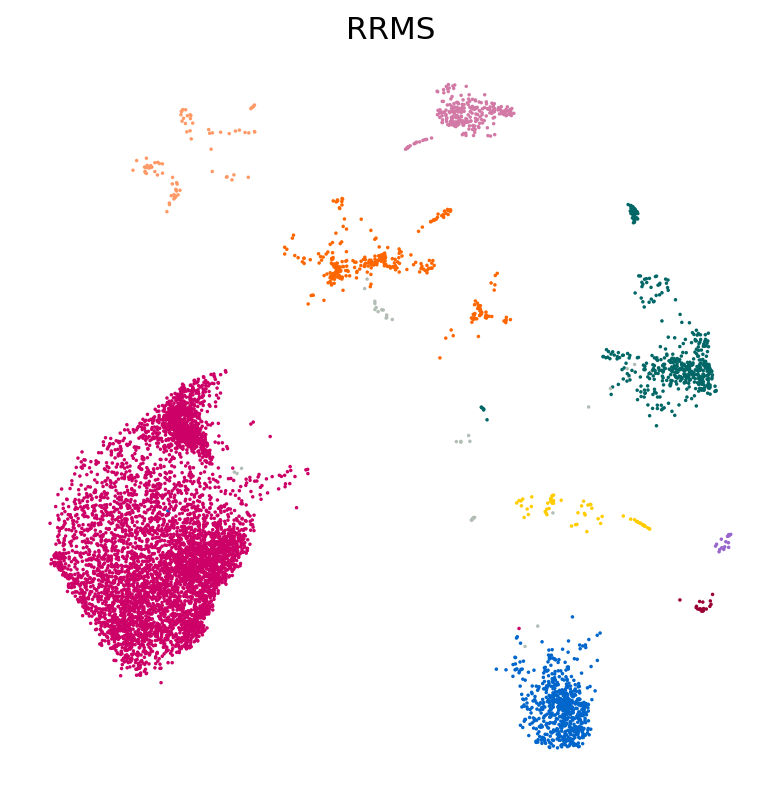

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


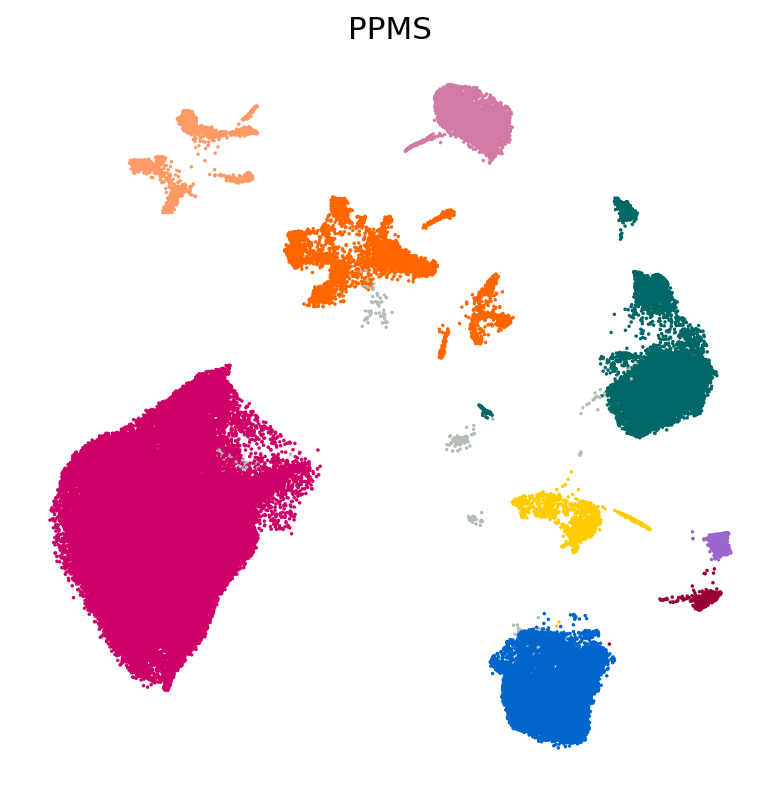

In [33]:
cluster_color = {
    'OPCs + COPs': '#d279a6',
    'MOLs': '#cc0066',
    'Microglia': '#0066cc',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffcc00',
    'T cells': '#990033',
    'B cells': '#9966cc',
    'Mixed': '#b2beb5'
}

# Plot each dataset separately
for publication in adata_all.obs['diagnosis'].unique():
    subset_data = adata_all[adata_all.obs['diagnosis'] == publication, :]
    filename = f"{publication}_hs_broad_cell_types_by_diagnosis"  # Unique filename for each plot
    sc.pl.umap(
        subset_data,
        color=["cluster_annotation"],
        cmap=mymap2,
        palette=cluster_color,  # Use the predefined color mapping
        title=publication,
        frameon=False,
        legend_loc=None,
        ncols=1,
        s=10,
        save=filename,  # Save with the unique filename
    )

In [ ]:
# Unique values in the 'condition' column
unique_conditions = adata_all.obs['lesion_type'].unique()
for condition in unique_conditions:
    print(condition)

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


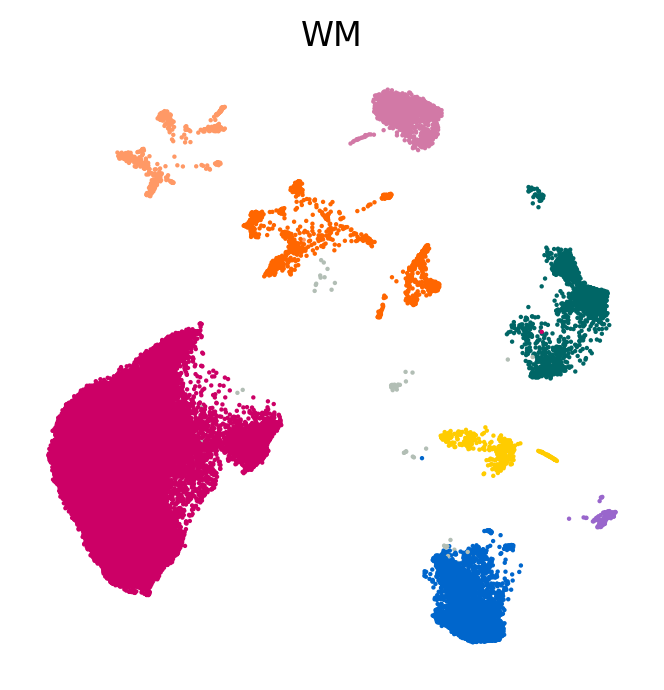

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


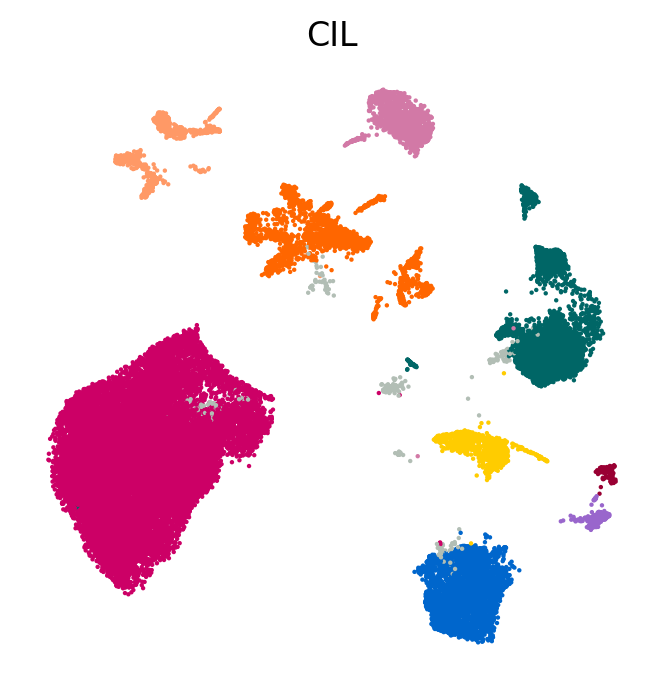

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


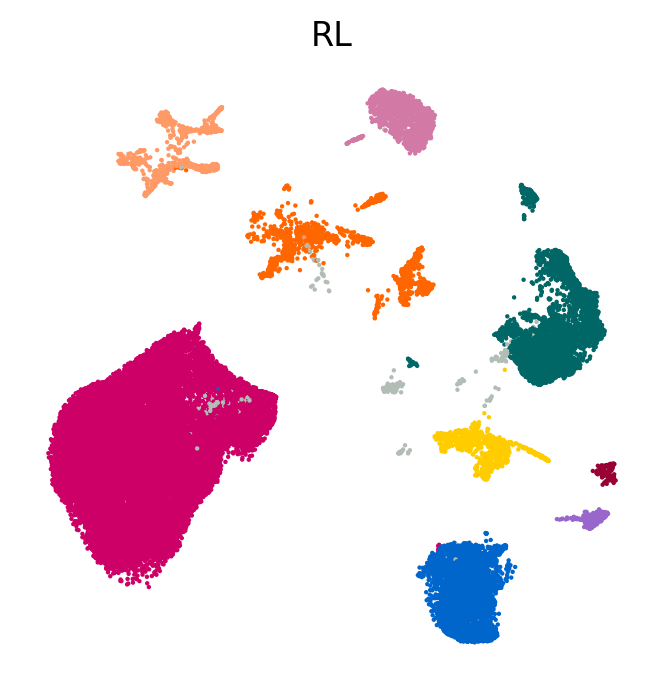

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


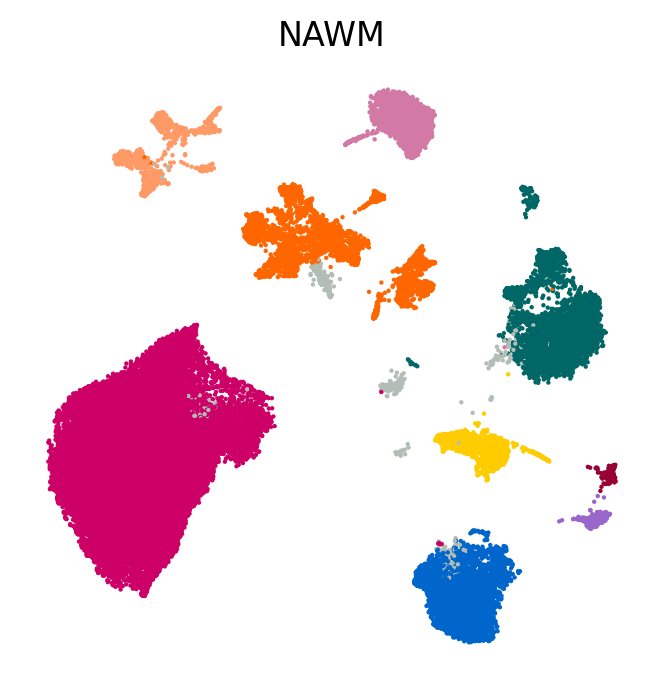

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


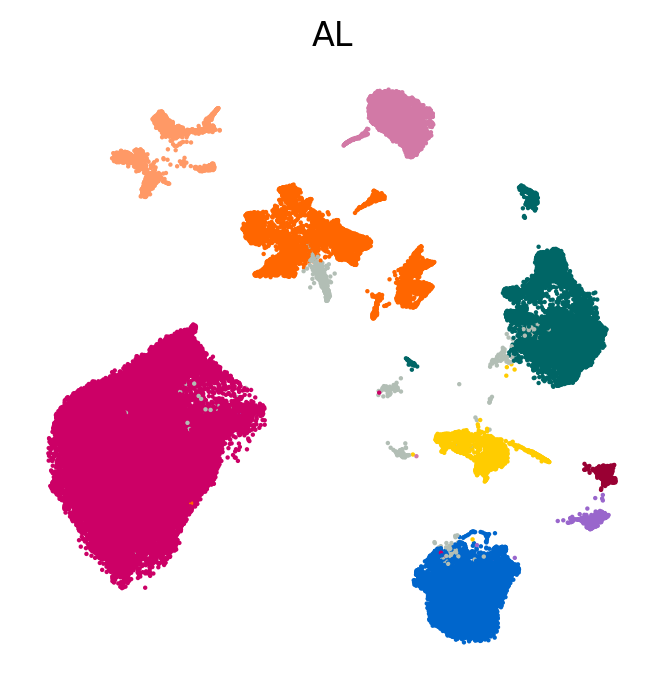

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


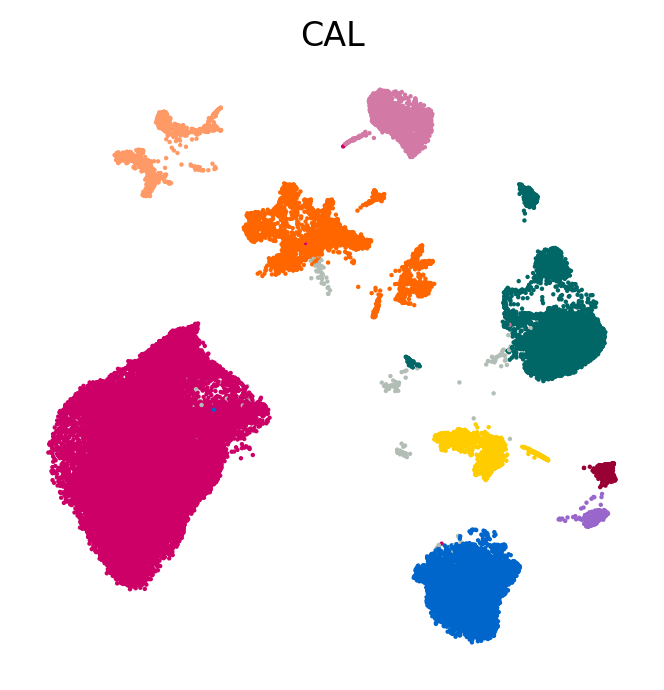

In [20]:
cluster_simplified_color = {
    'OPCs + COPs': '#d279a6',
    'MOLs': '#cc0066',
    'Microglia': '#0066cc',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffcc00',
    'T cells': '#9966cc',
    'B cells': '#990033',
    'Mixed': '#b2beb5'
}

# Plot each dataset separately
for publication in adata_all.obs['lesion_type'].unique():
    subset_data = adata_all[adata_all.obs['lesion_type'] == publication, :]
    filename = f"{publication}_hs_broad_cell_types_by_lesion_type"  # Unique filename for each plot
    sc.pl.umap(
        subset_data,
        color=["cluster_annotation"],
        cmap=mymap2,
        palette=cluster_simplified_color,  # Use the predefined color mapping
        title=publication,
        frameon=False,
        legend_loc=None,
        ncols=1,
        s=10,
        save=filename,  # Save with the unique filename
    )

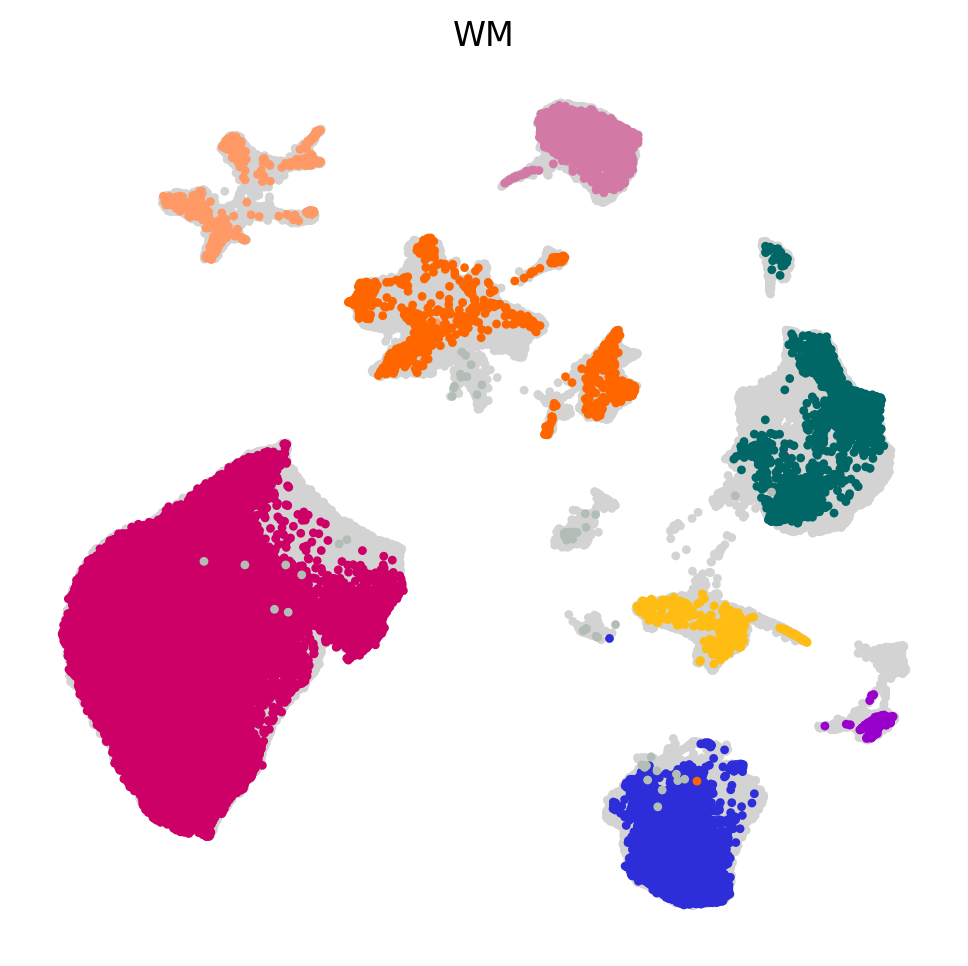

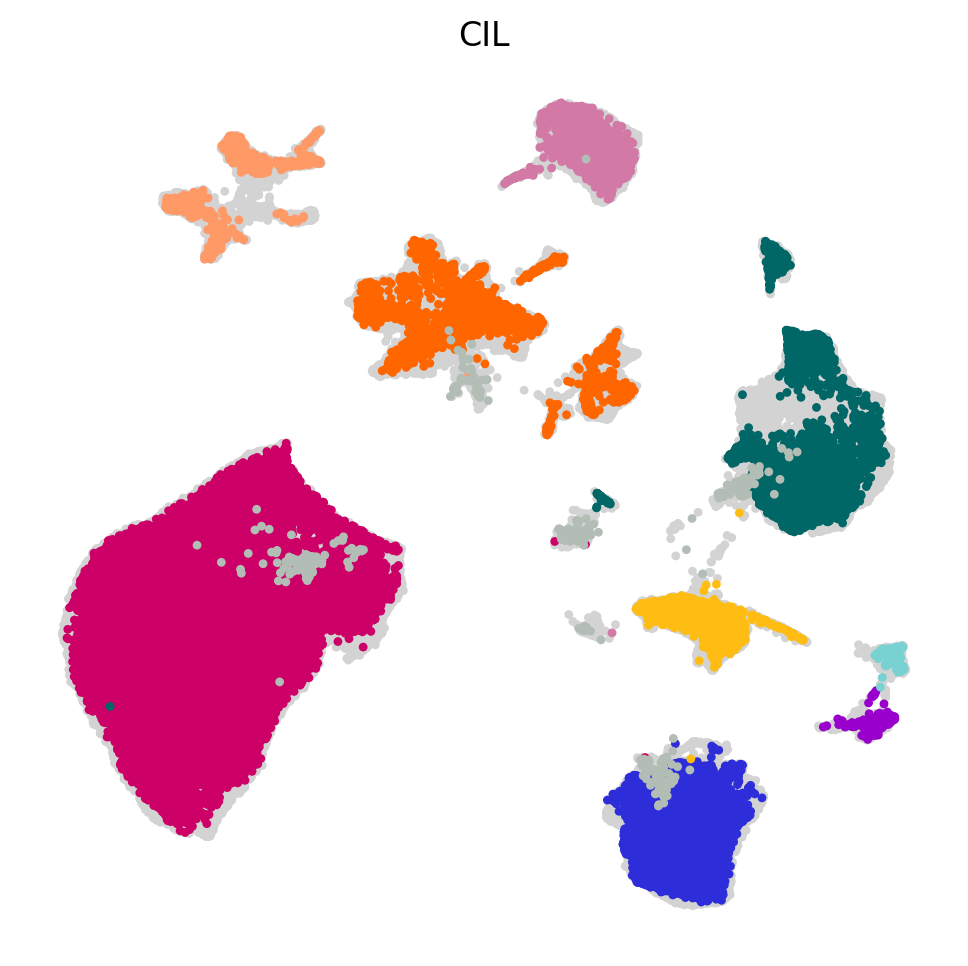

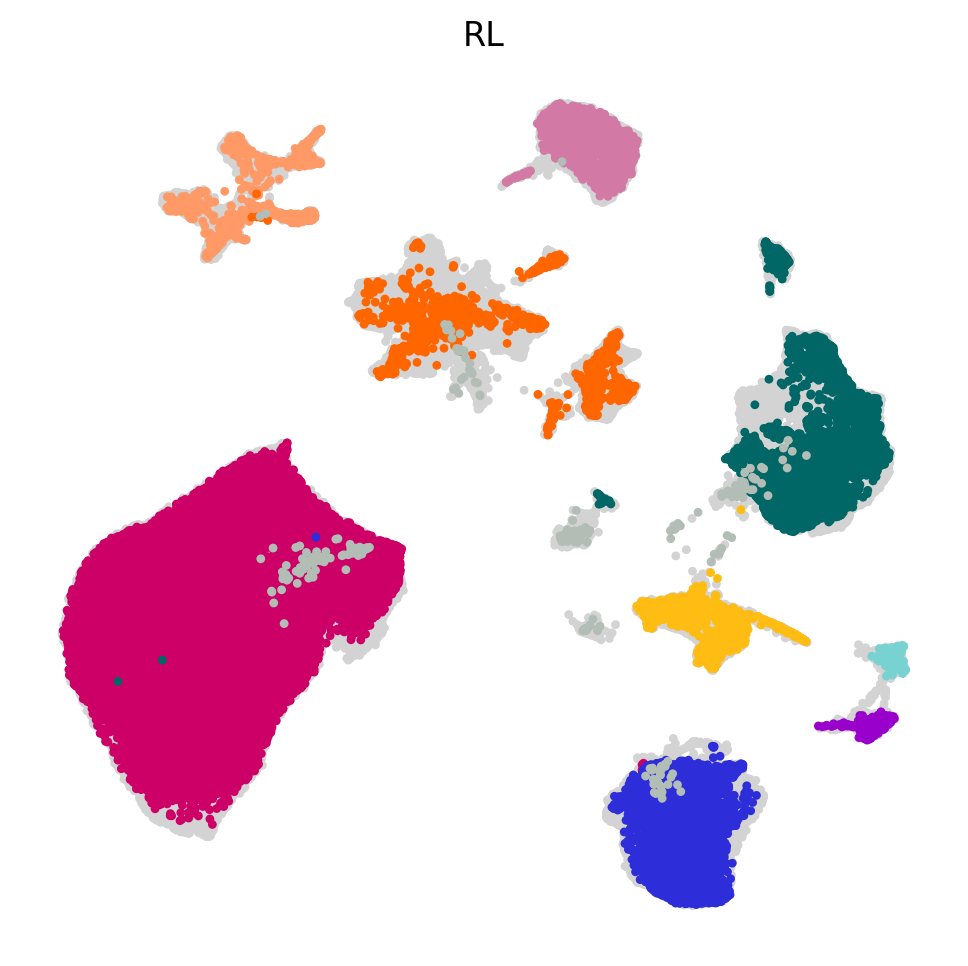

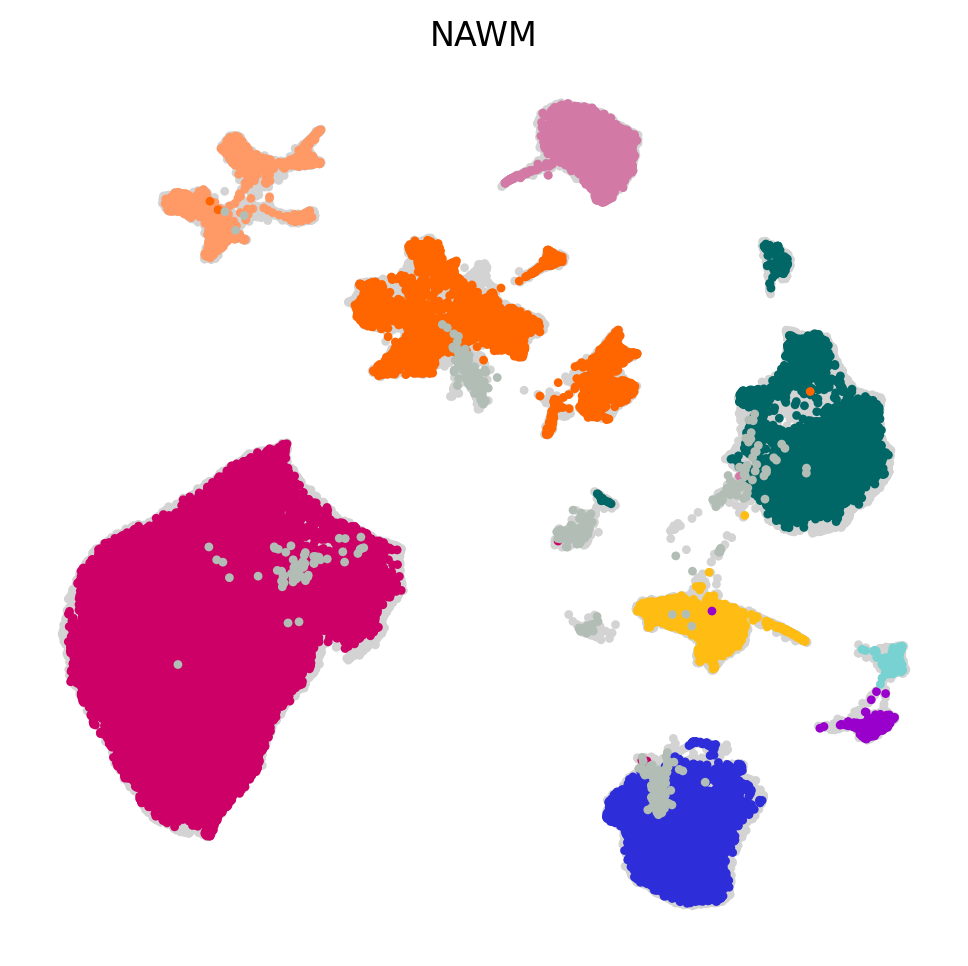

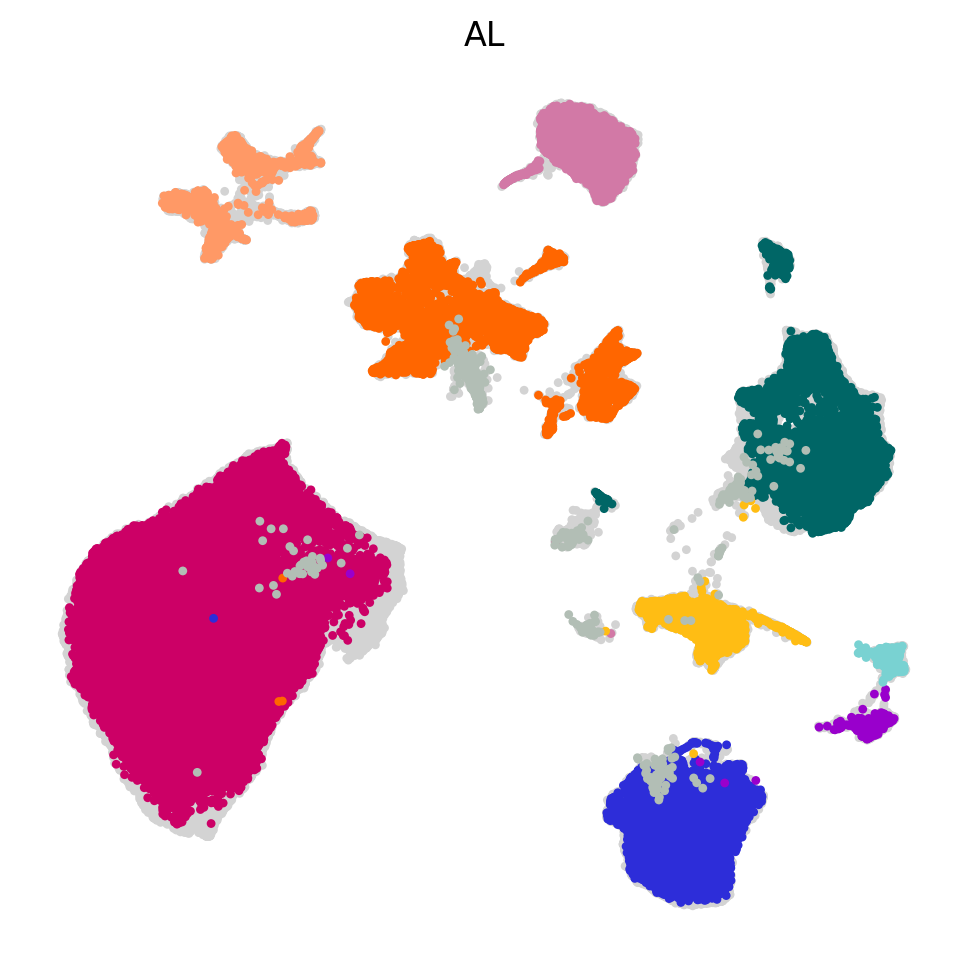

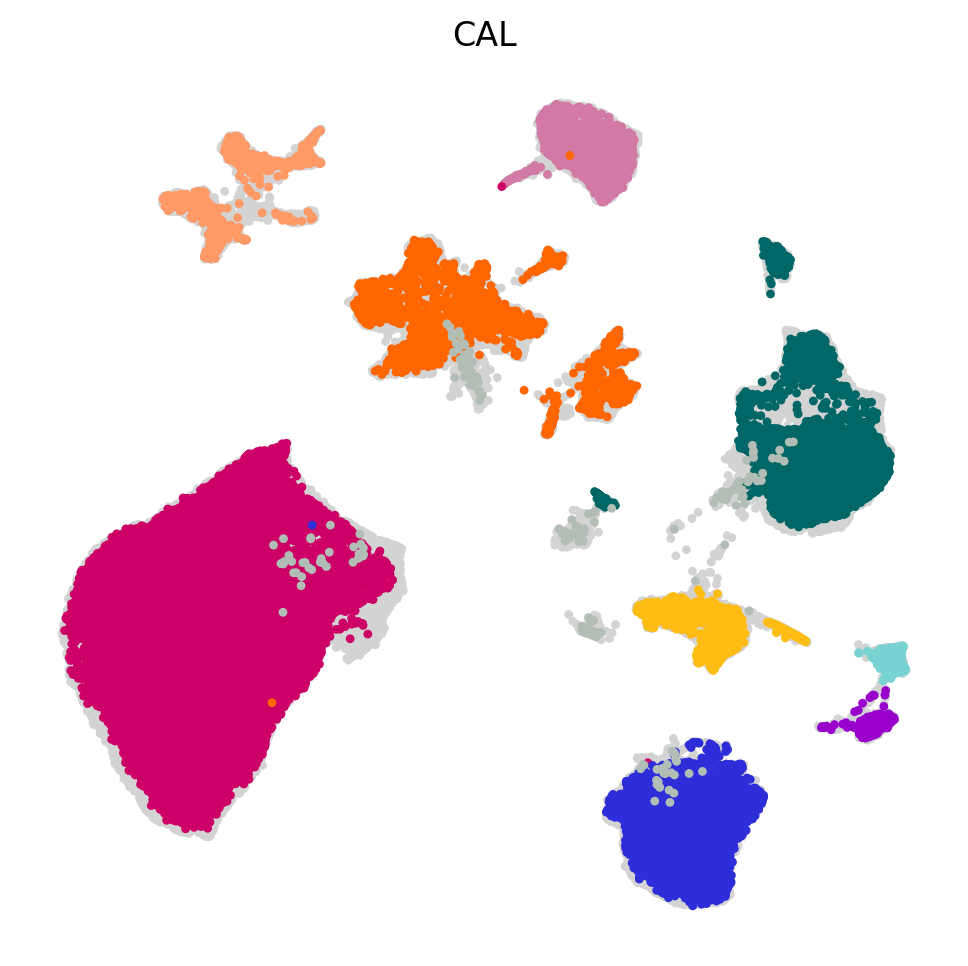

In [9]:
cluster_color = {
    'OPCs + COPs': '#d279a6',
    'MOLs': '#cc0066',
    'Microglia': '#2d2dd9',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffbd14',
    'T cells': '#9900cc',
    'B cells': '#79d2d2',
    'Mixed': '#b2beb5'
}
# Set a grey color for cells not in the current lesion_status
grey_color = '#d3d3d3'

# Iterate over unique lesion_statuses
for lesion_status in adata_all.obs['lesion_type'].unique():
    # Create a mask for cells in the specific lesion_status
    lesion_mask = adata_all.obs['lesion_type'] == lesion_status

    # Initialize color vector for cells not in the lesion_status
    colors = np.array([grey_color] * adata_all.shape[0])  # Initialize all to grey

    # Plot UMAP with grey dots first
    plt.figure(figsize=(5, 5))  # Ensure figure size matches settings
    umap_coords = adata_all.obsm['X_umap']
    grey_mask = ~lesion_mask
    plt.scatter(umap_coords[grey_mask, 0], umap_coords[grey_mask, 1], 
                color=grey_color, s=10, edgecolor='none')

    # Overlay cell type colors on top
    for cell_type in cluster_color:
        # Assign the specific cluster color for cells of the current type in the lesion_status
        cell_type_mask = (adata_all.obs['cluster_annotation'] == cell_type) & lesion_mask
        plt.scatter(umap_coords[cell_type_mask, 0], umap_coords[cell_type_mask, 1], 
                    color=cluster_color[cell_type], s=10, edgecolor='none')

    # Customize plot appearance
    plt.title(f"{lesion_status}", fontsize=12)  # Ensure title is added with fontsize
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    
    # Remove grid and axes
    plt.grid(False)
    plt.gca().set_axis_off()

    # Save the plot with specified parameters
    plt.tight_layout()
    plt.savefig(f"{sc.settings.figdir}/{lesion_status}_combined_umap.png", dpi=300, transparent=True)

    # Show the plot in the console
    plt.show()

    # Close the plot
    plt.close()

# QC plots

In [18]:
adata_all.var["mito"] = adata_all.var_names.str.startswith(("MT-"))

In [19]:
sc.pp.calculate_qc_metrics(
    adata_all, qc_vars=["mito"], inplace=True, percent_top=[20], log1p=True)

In [20]:
adata_all

AnnData object with n_obs × n_vars = 321566 × 29040
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC

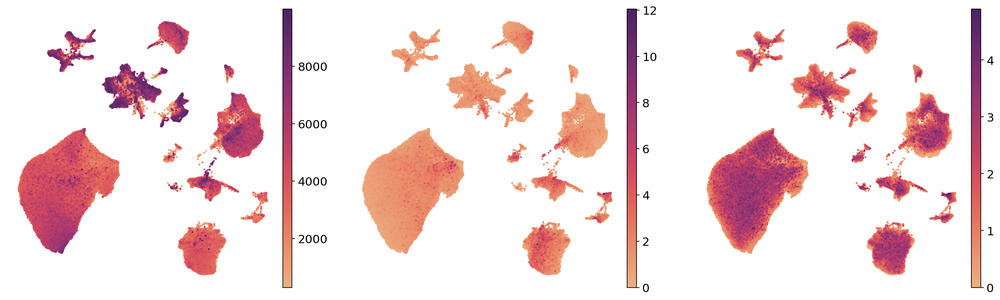

In [16]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

sc.pl.umap(adata_all, color=['n_genes_by_counts', 
                         'pct_counts_ribo','pct_counts_mito'], title=['','',''],
           cmap='flare',ncols=3, s=20, frameon=False,
          save='_Human_scVI_ALL_integration_QC_plots_reduced2.png')

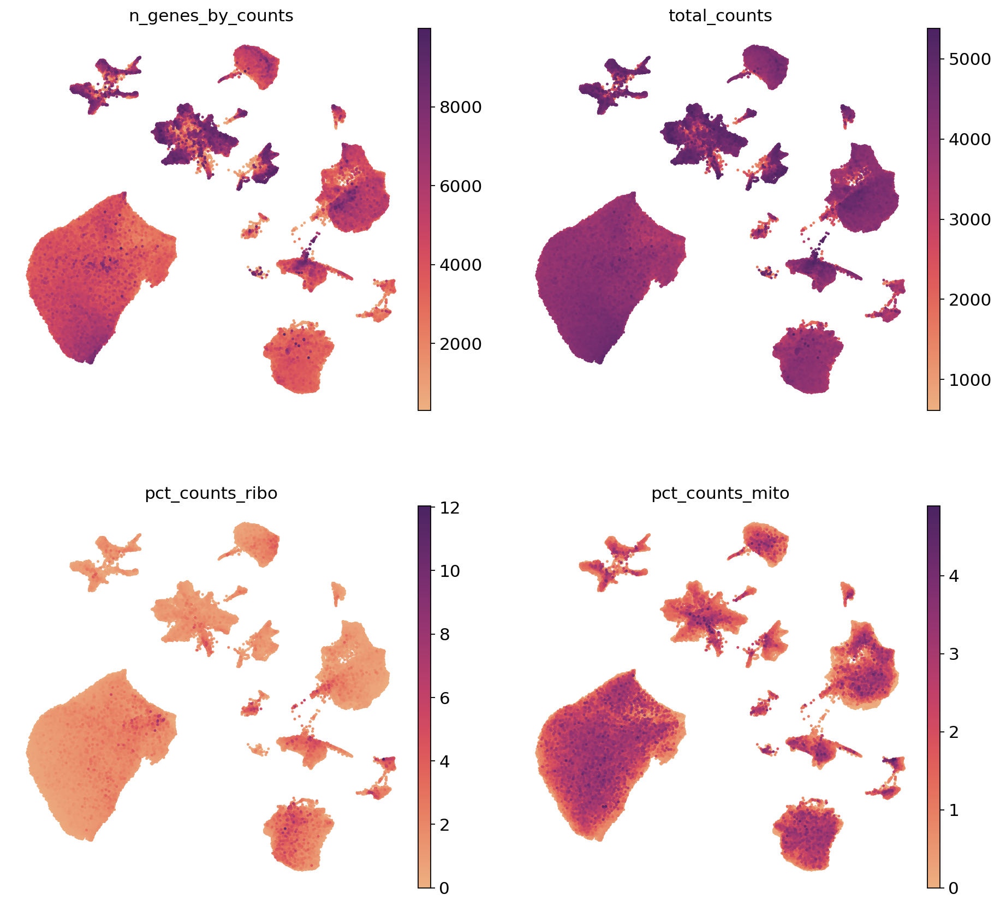

In [42]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

sc.pl.umap(adata_all, color=['n_genes_by_counts', 'total_counts', 
                         'pct_counts_ribo','pct_counts_mito'],
           cmap='flare',ncols=2, s=20, frameon=False,
          save='_Human_scVI_ALL_integration_QC_plots_reduced.png')

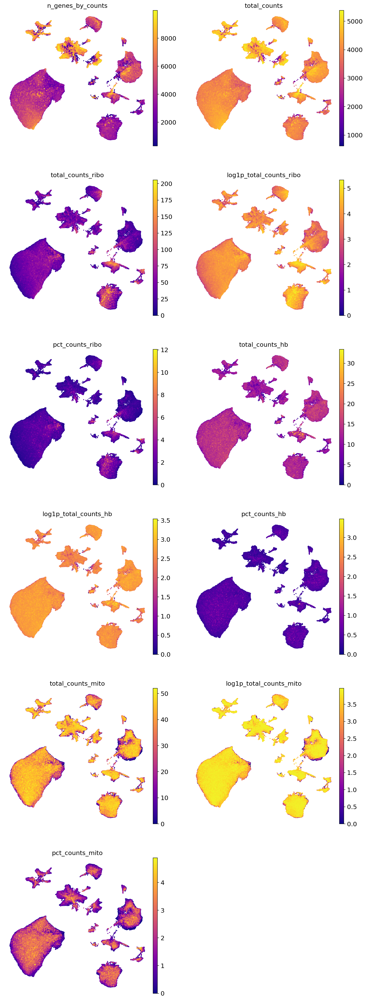

In [87]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

sc.pl.umap(adata_all, color=['n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'log1p_total_counts_ribo', 
                         'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 
                         'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'],
           cmap='plasma',ncols=2, s=20, frameon=False,
          save='_Human_scVI_ALL_integration_QC_plots.png')

In [61]:
# Set a random seed to ensure that the cell ordering will be reproducible
np.random.seed(0)
random_indices = np.random.permutation(list(range(adata_all.shape[0])))

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


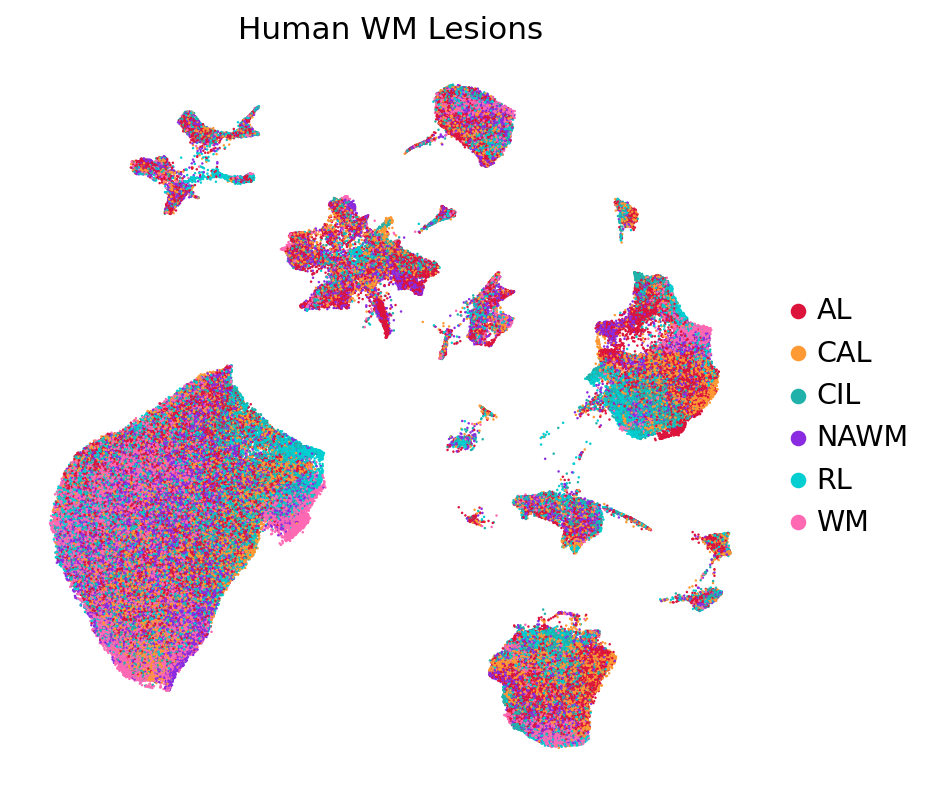

In [88]:
con_cl = ['#DC143C', '#ff9933', '#20B2AA', '#8A2BE2', '#00CED1', '#FF69B4',
          '#FFA07A', '#7FFF00', '#FF4500', '#4682B4', '#FFD700', '#808080']

sc.pl.umap(adata_all[random_indices, :],color='lesion_type',palette=con_cl, legend_fontweight= 'normal', frameon= False, s=5,
           title='Human WM Lesions',
           save='_Human_scVI_ALL_integration_lesions.png')           

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


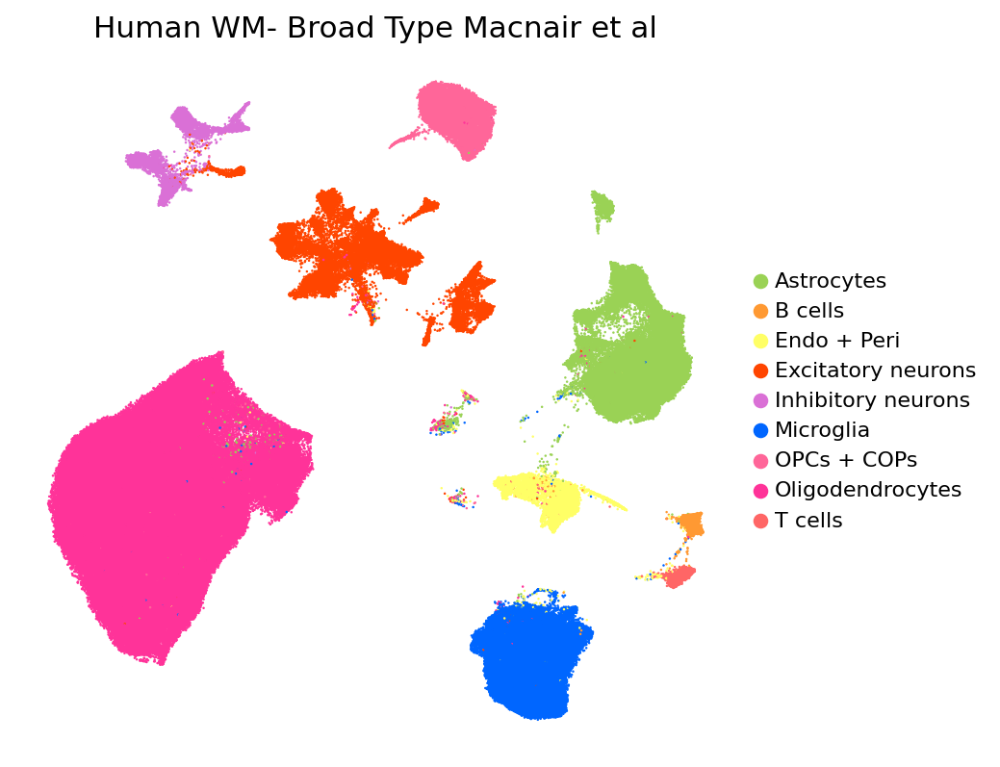

In [89]:
cluster_simplified_color = {
    'OPCs + COPs': '#ff6699',
    'Oligodendrocytes': '#ff3399',
    'Microglia': '#0066ff',
    'Astrocytes': '#9AD255',
    'Inhibitory neurons': '#DA70D6',
    'Excitatory neurons': '#FF4500',
    'Endo + Peri': '#ffff66',
    'T cells': '#ff6666',
    'B cells': '#ff9933'
}



#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['type_broad'], legend_fontsize =float(10) , wspace=0.6, 
           palette=cluster_simplified_color,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=5,
           title='Human WM- Broad Type Macnair et al',
           save='_Human_scVI_ALL_integration_broad_types.png')         

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


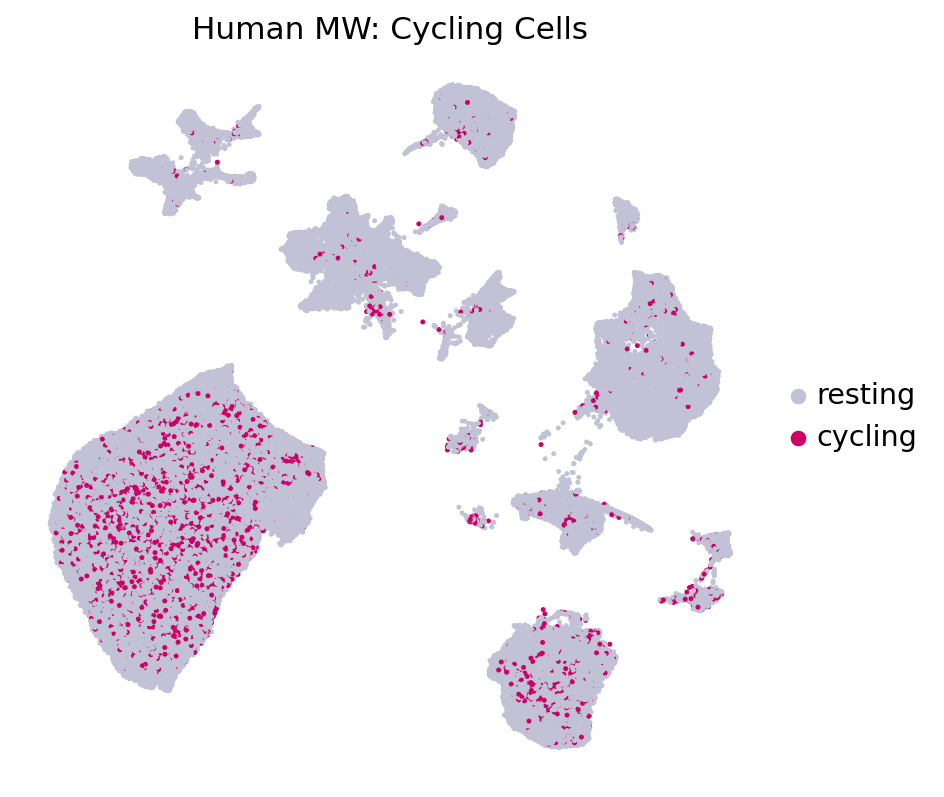

In [90]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

sc.pl.umap(adata_all, color=['Cycling_cells'],palette=['#c2c2d6', '#cc0066'], use_raw=False, frameon=False, 
           title='Human MW: Cycling Cells',
           cmap=mymap2, s=20, vmin=0, save='_Human_scVI_ALL_integration_cycling.png')

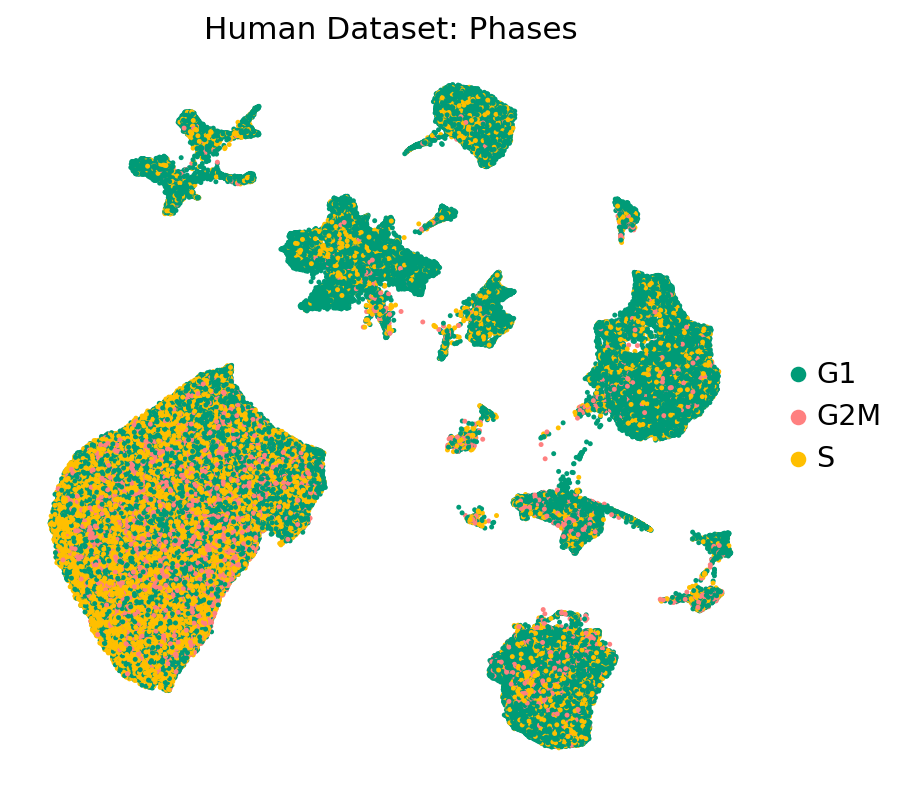

In [7]:
# Create a UMAP plot with adjusted parameters
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)  # High resolution and bigger figure size

pair2= ["#009B77", "#ff8080", "#ffbf00", "#9AD255", "#9AD255",
       "#b30047",   "#dada2b", "#dada2b"]


#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

sc.pl.umap(adata_all, color=['phase'],palette=pair2, use_raw=False, 
           title = 'Human Dataset: Phases', s=20,
           frameon=False, cmap=mymap2, ncols=1, 
           save='_Human_scVI_ALL_integration_phases.png')

# Need some images of markers

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:175: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_tidy.mask(~obs_bool).groupby(level=0).mean().fillna(0)
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided 

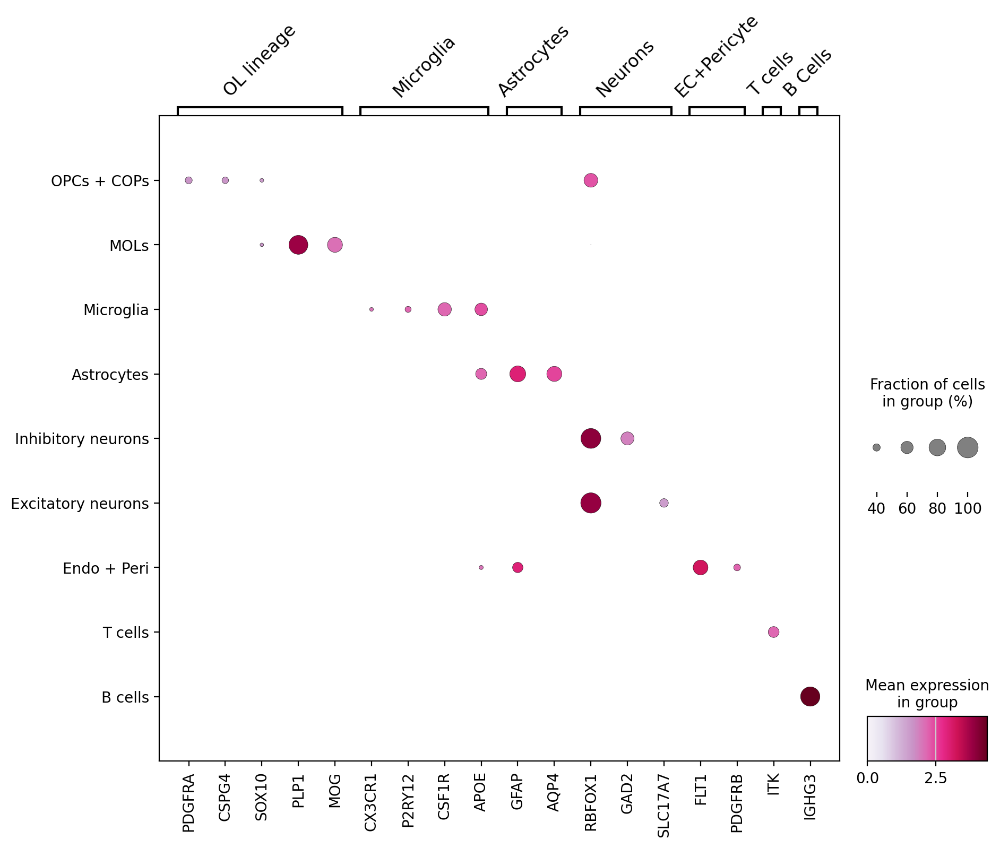

In [14]:
marker_genes = {
    'OL lineage': ['PDGFRA', 'CSPG4', 'SOX10', 'PLP1', 'MOG'],
    'Microglia': ['CX3CR1', 'P2RY12', 'CSF1R', 'APOE'],
    'Astrocytes': ['GFAP', 'AQP4'],
    'Neurons': ['RBFOX1', 'GAD2', 'SLC17A7'],
    'EC+Pericyte': ['FLT1', 'PDGFRB'],
    'T cells':['ITK'],
    'B Cells': ['IGHG3']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata_all,
        groupby="cluster_annotation",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        dot_min=0.2,
        mean_only_expressed=True,
        expression_cutoff=1,
    )

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:175: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_tidy.mask(~obs_bool).groupby(level=0).mean().fillna(0)
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided 

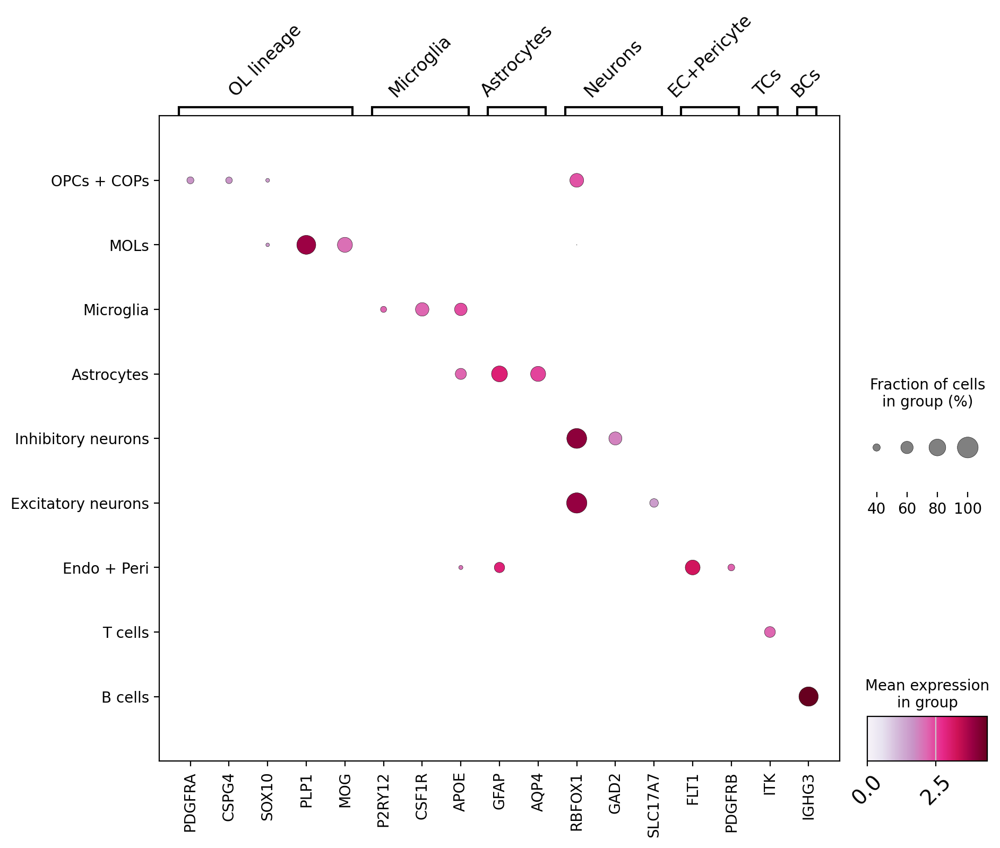

In [28]:
# Known marker genes with mouse gene names
marker_genes_human ={
    'OL lineage': ['PDGFRA', 'CSPG4', 'SOX10', 'PLP1', 'MOG'],
    'Microglia': ['P2RY12', 'CSF1R', 'APOE'],
    'Astrocytes': ['GFAP', 'AQP4'],
    'Neurons': ['RBFOX1', 'GAD2', 'SLC17A7'],
    'EC+Pericyte': ['FLT1', 'PDGFRB'],
    'TCs':['ITK'],
    'BCs': ['IGHG3']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes_human.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes_human.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata_all,
        groupby="cluster_annotation",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes_human.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        dot_min=0.2,
        mean_only_expressed=True,
        expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Save the plot as a PNG file
plt.savefig('./Human_scVI_single/figures_all/Human_dotplot_all_celltypes_markers.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

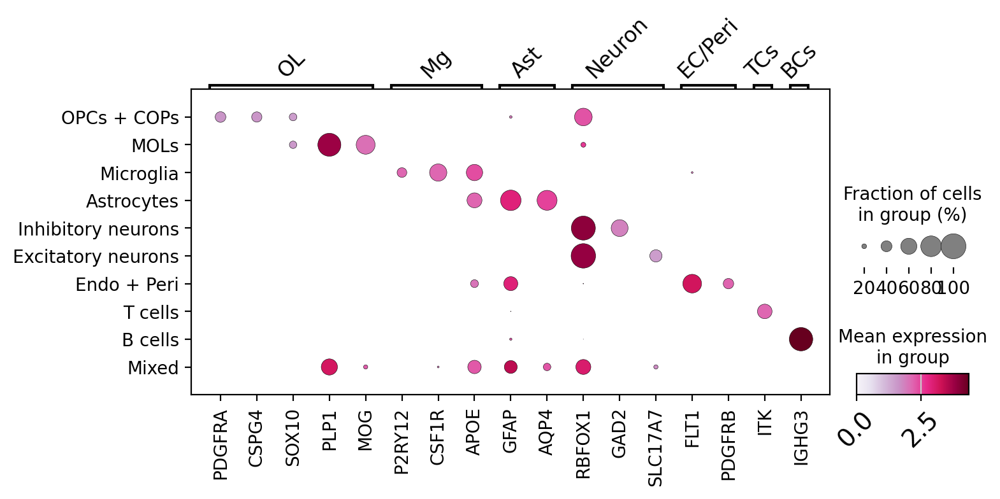

In [18]:
# Known marker genes with mouse gene names
marker_genes_human ={
    'OL': ['PDGFRA', 'CSPG4', 'SOX10', 'PLP1', 'MOG'],
    'Mg': ['P2RY12', 'CSF1R', 'APOE'],
    'Ast': ['GFAP', 'AQP4'],
    'Neuron': ['RBFOX1', 'GAD2', 'SLC17A7'],
    'EC/Peri': ['FLT1', 'PDGFRB'],
    'TCs':['ITK'],
    'BCs': ['IGHG3']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes_human.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes_human.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata_all,
        groupby="cluster_annotation",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes_human.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        dot_min=0.1,
        mean_only_expressed=True,
        expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.35)  # Adjust left margin to reduce space between dots: smaller gives more space
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.45) # adjust space up and down between dots, bigger makes bigger space

# Save the plot as a PNG file
plt.savefig('/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single/figures_all/Human_dotplot_all_celltypes_markers_ADJUSTED.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

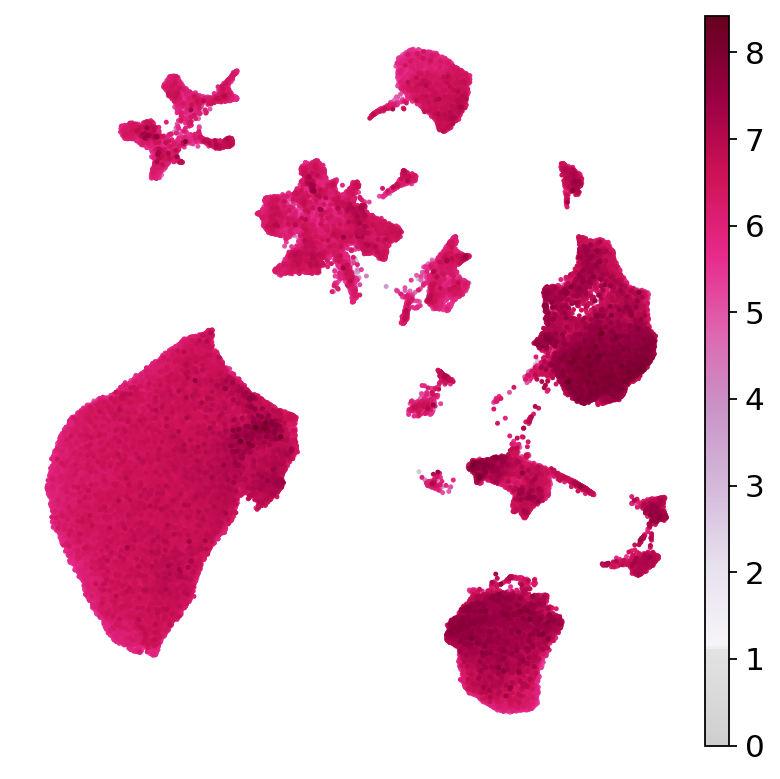

In [13]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import scanpy as sc


# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

sc.pl.umap(adata_all, 
           color=['MALAT1'], 
           use_raw=False, 
           color_map=mymap, 
           ncols=4, 
           frameon=False, 
           s=20,
           title='',
           legend_fontweight='bold', 
           legend_fontoutline=1,
           save='_Human_scVI_MALAT1.png')

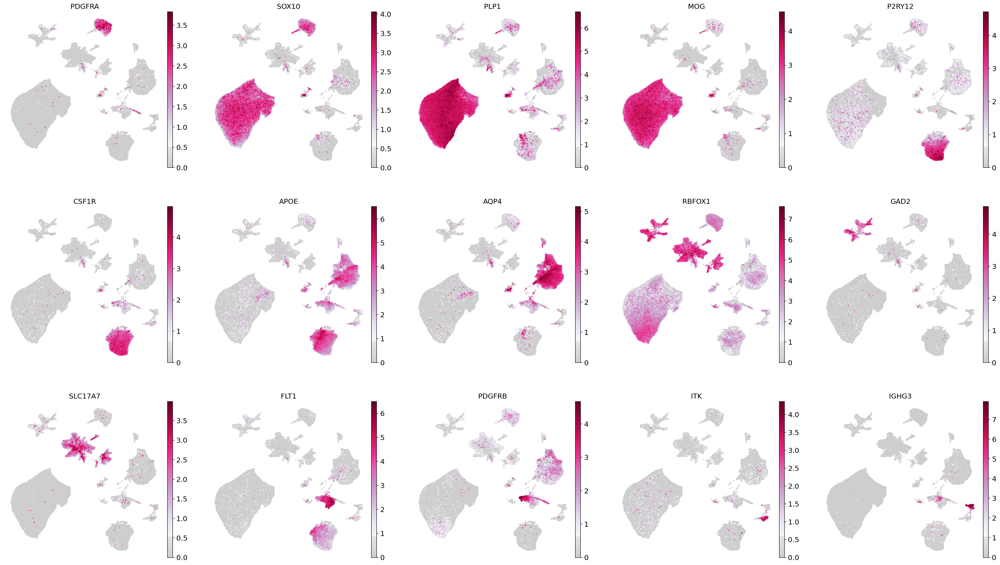

In [17]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import scanpy as sc


# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

sc.pl.umap(adata_all, 
           color=['PDGFRA', 'SOX10', 'PLP1', 'MOG',
                 'P2RY12', 'CSF1R', 'APOE', 'AQP4',
                 'RBFOX1', 'GAD2', 'SLC17A7', 'FLT1', 'PDGFRB', 'ITK', 'IGHG3'], 
           use_raw=False, 
           color_map=mymap, 
           ncols=5, 
           frameon=False, 
           s=20, 
           legend_fontweight='bold', 
           legend_fontoutline=1,
           save='_Human_scVI_ALL_markers.png')

# Sub sampling scVI ALL

In [18]:
adata_all.obs['lesion_type'].value_counts()

lesion_type
AL      71049
NAWM    58176
CAL     57991
WM      53729
RL      42972
CIL     37649
Name: count, dtype: int64

In [19]:
MS_AL = sc.pp.subsample(adata_all[adata_all.obs['lesion_type']=='AL'],n_obs=37649,copy=True).obs_names
MS_NAWM = sc.pp.subsample(adata_all[adata_all.obs['lesion_type']=='NAWM'],n_obs=37649,copy=True).obs_names
MS_CAL = sc.pp.subsample(adata_all[adata_all.obs['lesion_type']=='CAL'],n_obs=37649,copy=True).obs_names
hs_WM = sc.pp.subsample(adata_all[adata_all.obs['lesion_type']=='WM'],n_obs=37649,copy=True).obs_names
MS_RL = sc.pp.subsample(adata_all[adata_all.obs['lesion_type']=='RL'],n_obs=37649,copy=True).obs_names
MS_CIL = sc.pp.subsample(adata_all[adata_all.obs['lesion_type']=='CIL'],n_obs=37649,copy=True).obs_names

In [20]:
adata_all_subsample = adata_all[list(hs_WM) + list(MS_AL) + list(MS_NAWM) + list(MS_CAL) + list(MS_RL) +
                                list(MS_CIL) ].copy()

sc.tl.embedding_density(adata_all_subsample, basis='umap', groupby='lesion_type')

computing density on 'umap'
--> added
    'umap_density_lesion_type', densities (adata.obs)
    'umap_density_lesion_type_params', parameter (adata.uns)


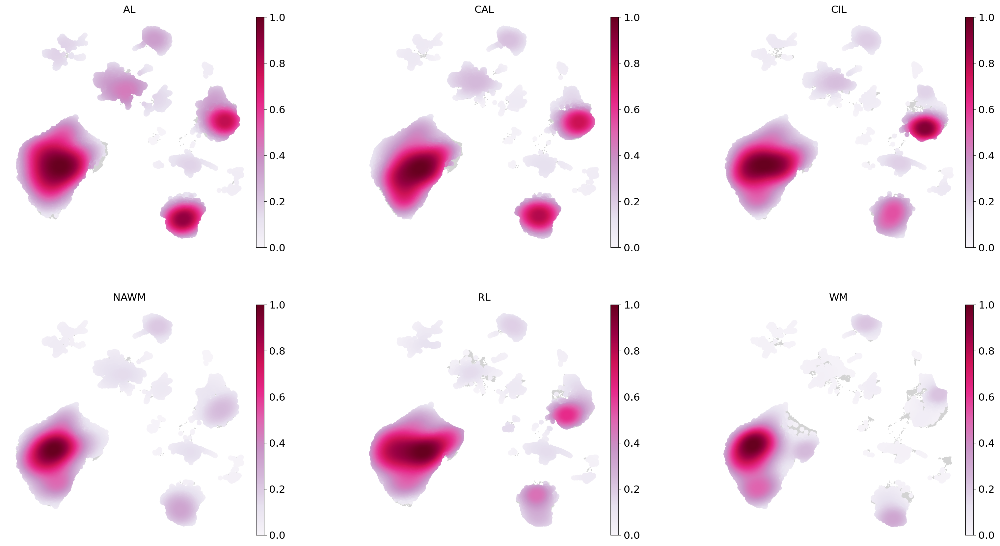

In [21]:
sc.pl.embedding_density(adata_all_subsample, basis='umap',  key='umap_density_lesion_type', 
                        color_map='PuRd', wspace=0.3, bg_dotsize = 8, frameon= False, 
                        ncols=3, save='_Human_scVI_ALL_lesion_density.png')

# Add some bar charts

In [24]:
adata_all

AnnData object with n_obs × n_vars = 321566 × 29040
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC

In [10]:
# Group by 'treatment_meta' and 'cell_type_eval' to count cells
cell_type_counts = adata_all.obs.groupby(['lesion_type', 'cluster_annotation']).size().reset_index(name='cell_count')

# Pivot the DataFrame to have treatments as index and cell types as columns
pivoted_counts = cell_type_counts.pivot(index='cluster_annotation', columns='lesion_type', values='cell_count').fillna(0)

#Add totals
total_cells = pivoted_counts.sum()

#Add percent
percent_counts = pivoted_counts.div(total_cells) * 100
percent_counts_transposed = percent_counts.transpose()
percent_counts_transposed

/tmp/ipykernel_1851471/1381736364.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_type_counts = adata_all.obs.groupby(['lesion_type', 'cluster_annotation']).size().reset_index(name='cell_count')


cluster_annotation,OPCs + COPs,MOLs,Microglia,Astrocytes,Inhibitory neurons,Excitatory neurons,Endo + Peri,T cells,B cells,Mixed
lesion_type,,,,,,,,,,
AL,4.471562,44.939408,14.247913,15.131810,3.857901,10.982561,2.494053,0.456023,0.468691,2.950077
CAL,3.405701,52.108086,15.838665,15.264438,2.243452,7.254574,2.371058,0.491456,0.601818,0.420755
CIL,3.261707,54.418444,11.801110,16.544928,2.363941,6.496853,2.937661,1.017291,0.207177,0.950888
NAWM,4.204483,65.313875,8.711496,8.213009,2.169279,7.085396,2.880913,0.400509,0.139233,0.881807
RL,3.041515,61.928698,9.862236,13.196965,2.601694,3.702411,2.722703,0.772596,0.223401,1.947780
WM,4.552476,76.400082,8.613598,5.630107,1.081353,2.689423,0.774256,0.158201,0.000000,0.100504


In [11]:
# Define the desired order of treatments and cell types
desired_treatments_order = ['WM', 'NAWM', 'AL', 
                            'CAL', 'CIL', 'RL']

desired_cell_types_order = ['OPCs + COPs', 'MOLs', 'Microglia', 'Astrocytes', 'Mixed', 'Excitatory neurons', 'Inhibitory neurons',
                            'Endo + Peri', 'T cells', 'B cells']

# Reorder the columns and the index of the percent_counts DataFrame
percent_counts_reordered = percent_counts_transposed[desired_cell_types_order].reindex(desired_treatments_order)
percent_counts_reordered

cluster_annotation,OPCs + COPs,MOLs,Microglia,Astrocytes,Mixed,Excitatory neurons,Inhibitory neurons,Endo + Peri,T cells,B cells
lesion_type,,,,,,,,,,
WM,4.552476,76.400082,8.613598,5.630107,0.100504,2.689423,1.081353,0.774256,0.158201,0.000000
NAWM,4.204483,65.313875,8.711496,8.213009,0.881807,7.085396,2.169279,2.880913,0.400509,0.139233
AL,4.471562,44.939408,14.247913,15.131810,2.950077,10.982561,3.857901,2.494053,0.456023,0.468691
CAL,3.405701,52.108086,15.838665,15.264438,0.420755,7.254574,2.243452,2.371058,0.491456,0.601818
CIL,3.261707,54.418444,11.801110,16.544928,0.950888,6.496853,2.363941,2.937661,1.017291,0.207177
RL,3.041515,61.928698,9.862236,13.196965,1.947780,3.702411,2.601694,2.722703,0.772596,0.223401


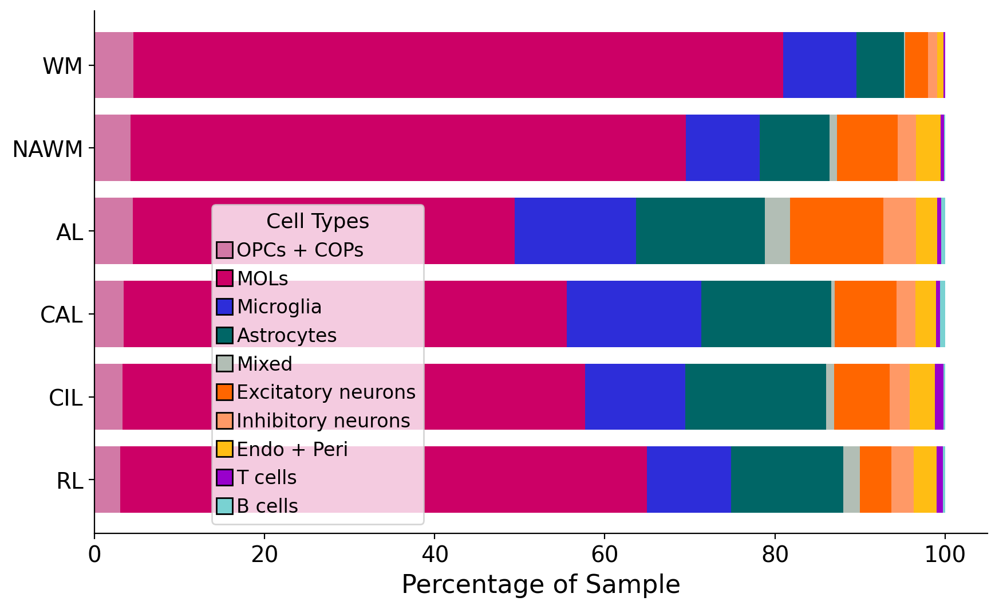

In [12]:
# Define the custom color map for the updated cell types, including 'Other'
custom_colors = {
    'OPCs + COPs': '#d279a6',
    'MOLs': '#cc0066',
    'Microglia': '#2d2dd9',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffbd14',
    'T cells': '#9900cc',
    'B cells': '#79d2d2',
    'Mixed': '#b2beb5',
    'Other': '#d3d3d3'  # Light grey for the 'Other' category
}

# Define the colors for the stacked bar chart in the order of desired_cell_types_order_updated
colors = [custom_colors[cell_type] for cell_type in desired_cell_types_order]

# Plot the horizontal stacked bar chart with custom colors
ax = percent_counts_reordered.plot(kind='barh', stacked=True, figsize=(10, 6), color=colors, width=0.8)

# Set the title and labels with increased font size
ax.set_xlabel('Percentage of Sample', fontsize=16)  # Increase font size

# Remove y-axis label
ax.set_ylabel('')  # Empty string to remove label

# Increase font size of ticks
plt.xticks(fontsize=14)  # Increase font size
plt.yticks(fontsize=14)  # Increase font size

# Invert the y-axis to reverse the order
ax.invert_yaxis()

# Remove grid lines
ax.grid(False)

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

# Show only x and y axis lines
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

# Create legend with dark grey border around color blocks
legend_handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=custom_colors[col], markersize=10, markeredgecolor='black') for col in percent_counts_reordered.columns]

# Adjust legend position
ax.legend(legend_handles, percent_counts_reordered.columns, loc='lower center', fontsize=12, title='Cell Types', bbox_to_anchor=(0.25, 0), title_fontsize='13')

# Save the plot as a PNG file
plt.savefig('./figures_all/cell_types_barh_NEW_ALL.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

In [13]:
# Define the desired order of treatments and cell types
desired_treatments_order = ['WM', 'NAWM', 'AL', 
                            'CAL', 'CIL', 'RL']

desired_cell_types_order = ['OPCs + COPs', 'MOLs', 'Microglia', 'Astrocytes', 'Mixed', 'Excitatory neurons', 'Inhibitory neurons',
                            'Endo + Peri', 'T cells', 'B cells']

# Reorder the columns and the index of the percent_counts DataFrame
percent_counts_reordered = percent_counts_transposed[desired_cell_types_order].reindex(desired_treatments_order)

# Sum the counts of the specified cell types to create the 'other' category
percent_counts_reordered['Other'] = percent_counts_reordered[['Mixed', 'Excitatory neurons', 'Inhibitory neurons',
                            'Endo + Peri']].sum(axis=1)

# Remove the individual cell type columns from the DataFrame
percent_counts_reordered.drop(columns=['Mixed', 'Excitatory neurons', 'Inhibitory neurons',
                            'Endo + Peri'], inplace=True)

# Sum the counts of the specified cell types to create the 'other' category
percent_counts_reordered['T/B cells'] = percent_counts_reordered[['T cells', 'B cells']].sum(axis=1)

# Remove the individual cell type columns from the DataFrame
percent_counts_reordered.drop(columns=['T cells', 'B cells'], inplace=True)

# Reorder the columns of the DataFrame with the 'other' category included
desired_cell_types_order_updated = ['OPCs + COPs', 'MOLs', 'Microglia', 'Astrocytes', 'T/B cells', 'Other']
percent_counts_reordered = percent_counts_reordered[desired_cell_types_order_updated]

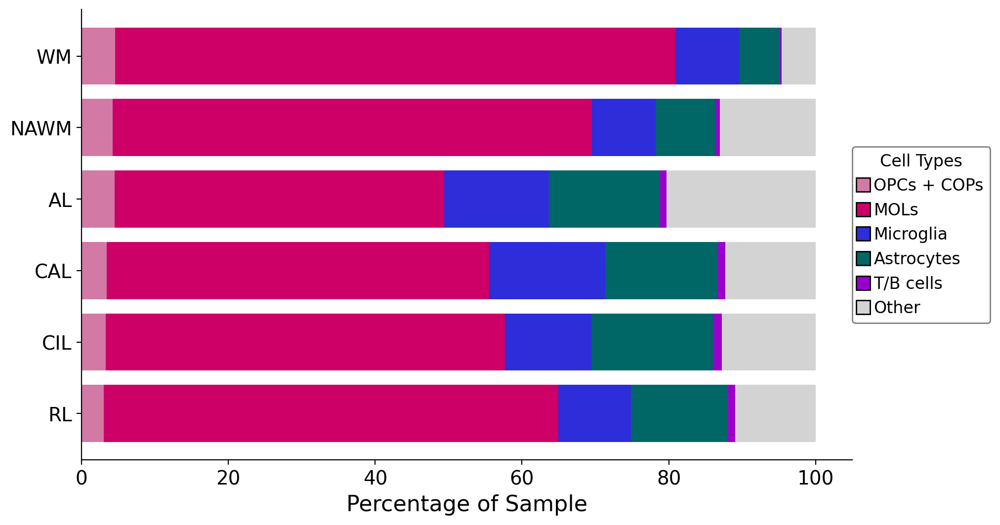

In [16]:
# Define the custom color map for the updated cell types, including 'Other'
custom_colors = {
    'OPCs + COPs': '#d279a6',
    'MOLs': '#cc0066',
    'Microglia': '#2d2dd9',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffbd14',
    'T/B cells': '#9900cc',
    'Mixed': '#b2beb5',
    'Other': '#d3d3d3'  # Light grey for the 'Other' category
}

colors = [custom_colors[cell_type] for cell_type in desired_cell_types_order_updated]

# Plot the horizontal stacked bar chart with custom colors
ax = percent_counts_reordered.plot(kind='barh', stacked=True, figsize=(10, 6), color=colors, width=0.8)

# Set the title and labels with increased font size
ax.set_xlabel('Percentage of Sample', fontsize=16)  # Increase font size

# Remove y-axis label
ax.set_ylabel('')  # Empty string to remove label

# Increase font size of ticks
plt.xticks(fontsize=14)  # Increase font size
plt.yticks(fontsize=14)  # Increase font size

# Invert the y-axis to reverse the order
ax.invert_yaxis()

# Remove grid lines
ax.grid(False)

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

# Create legend with transparency
legend_handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=custom_colors[col], markersize=10, markeredgecolor='black') for col in percent_counts_reordered.columns]
#legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='lower center', fontsize=12, title='Cell Types')
legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='center left', fontsize=12, title='Cell Types', bbox_to_anchor=(1, 0.5), borderaxespad=0.)

# Set transparency of the legend
legend.get_frame().set_alpha(0.5)  # Set alpha value for transparency (0.5 makes it semi-transparent)

# Optionally, add a border color for contrast
legend.get_frame().set_edgecolor('black')  # Set border color of the legend

# Save the plot as a PNG file
plt.savefig('./figures_all/ALL_hs_cell_types_barh_USE.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

In [17]:
# Define the desired order of treatments and cell types
desired_treatments_order = ['WM', 'NAWM', 'AL', 
                            'CAL', 'CIL', 'RL']

desired_cell_types_order = ['OPCs + COPs', 'MOLs', 'Microglia', 'Astrocytes', 'Mixed', 'Excitatory neurons', 'Inhibitory neurons',
                            'Endo + Peri', 'T cells', 'B cells']

# Reorder the columns and the index of the percent_counts DataFrame
percent_counts_reordered = percent_counts_transposed[desired_cell_types_order].reindex(desired_treatments_order)

# Sum the counts of the specified cell types to create the 'other' category
percent_counts_reordered['Other'] = percent_counts_reordered[['Mixed', 'Excitatory neurons', 'Inhibitory neurons',
                            'Endo + Peri', 'T cells', 'B cells']].sum(axis=1)

# Remove the individual cell type columns from the DataFrame
percent_counts_reordered.drop(columns=['Mixed', 'Excitatory neurons', 'Inhibitory neurons',
                            'Endo + Peri', 'T cells', 'B cells'], inplace=True)

# Reorder the columns of the DataFrame with the 'other' category included
desired_cell_types_order_updated = ['OPCs + COPs', 'MOLs', 'Microglia', 'Astrocytes', 'Other']
percent_counts_reordered = percent_counts_reordered[desired_cell_types_order_updated]

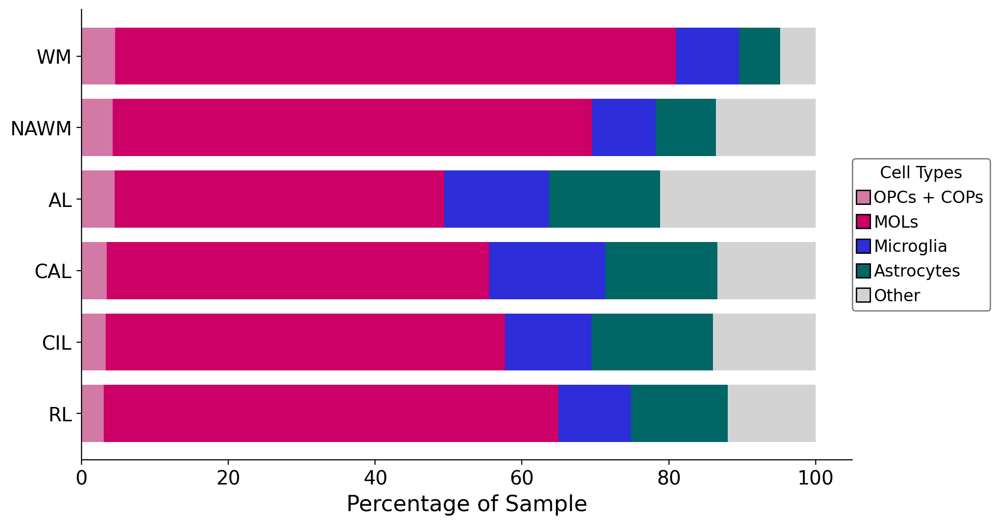

In [18]:
# Define the custom color map for the updated cell types, including 'Other'
custom_colors = {
    'OPCs + COPs': '#d279a6',
    'MOLs': '#cc0066',
    'Microglia': '#2d2dd9',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffbd14',
    'T/B cells': '#9900cc',
    'Mixed': '#b2beb5',
    'Other': '#d3d3d3'  # Light grey for the 'Other' category
}


# Define the colors for the stacked bar chart in the order of desired_cell_types_order_updated
colors = [custom_colors[cell_type] for cell_type in desired_cell_types_order_updated]

# Plot the horizontal stacked bar chart with custom colors
ax = percent_counts_reordered.plot(kind='barh', stacked=True, figsize=(10, 6), color=colors, width=0.8)

# Set the title and labels with increased font size
ax.set_xlabel('Percentage of Sample', fontsize=16)  # Increase font size

# Remove y-axis label
ax.set_ylabel('')  # Empty string to remove label

# Increase font size of ticks
plt.xticks(fontsize=14)  # Increase font size
plt.yticks(fontsize=14)  # Increase font size

# Invert the y-axis to reverse the order
ax.invert_yaxis()

# Remove grid lines
ax.grid(False)

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

# Create legend with transparency
legend_handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=custom_colors[col], markersize=10, markeredgecolor='black') for col in percent_counts_reordered.columns]
#legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='lower center', fontsize=12, title='Cell Types')
legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='center left', fontsize=12, title='Cell Types', bbox_to_anchor=(1, 0.5), borderaxespad=0.)

# Set transparency of the legend
legend.get_frame().set_alpha(0.5)  # Set alpha value for transparency (0.5 makes it semi-transparent)

# Optionally, add a border color for contrast
legend.get_frame().set_edgecolor('black')  # Set border color of the legend

# Save the plot as a PNG file
plt.savefig('./figures_all/ALL_hs_cell_types_barh.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

# Plot mcnair cell type labels

In [43]:
adata_all

AnnData object with n_obs × n_vars = 321566 × 29040
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC

In [45]:
# Unique values in the 'condition' column
unique_conditions = adata_all.obs['type_broad'].unique()
for condition in unique_conditions:
    print(condition)

Oligodendrocytes

Microglia

Astrocytes

Endo + Peri

Inhibitory neurons

Excitatory neurons

OPCs + COPs

T cells

B cells

In [48]:
# Set a random seed to ensure that the cell ordering will be reproducible
np.random.seed(0)
random_indices = np.random.permutation(list(range(adata_all.shape[0])))

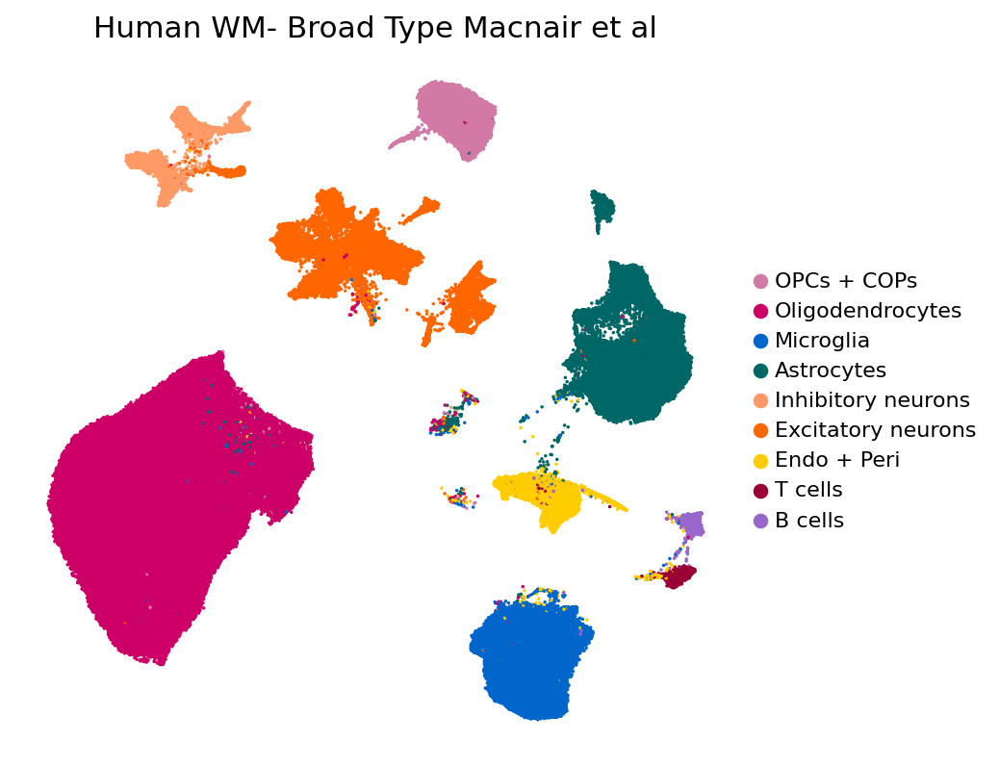

In [8]:
cluster_color = {
    'OPCs + COPs': '#d279a6',
    'Oligodendrocytes': '#cc0066',
    'Microglia': '#0066cc',
    'Astrocytes': '#006666',
    'Inhibitory neurons': '#ff9966',
    'Excitatory neurons': '#ff6600',
    'Endo + Peri': '#ffcc00',
    'T cells': '#990033',
    'B cells': '#9966cc'
}

# Define the order of cell types
cell_type_order = ['OPCs + COPs', 'Oligodendrocytes', 'Microglia', 'Astrocytes', 'Inhibitory neurons', 
                   'Excitatory neurons', 'Endo + Peri', 'T cells', 'B cells']

# Reorder the cell types
adata_all.obs['type_broad'] = pd.Categorical(adata_all.obs['type_broad'], 
                                                     categories=cell_type_order, ordered=True)

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['type_broad'], legend_fontsize =float(10) , wspace=0.6, 
           palette=cluster_color,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=10,
           title='Human WM- Broad Type Macnair et al',
           save='_Human_scVI_ALL_integration_broad_types_Mcnair.png')       

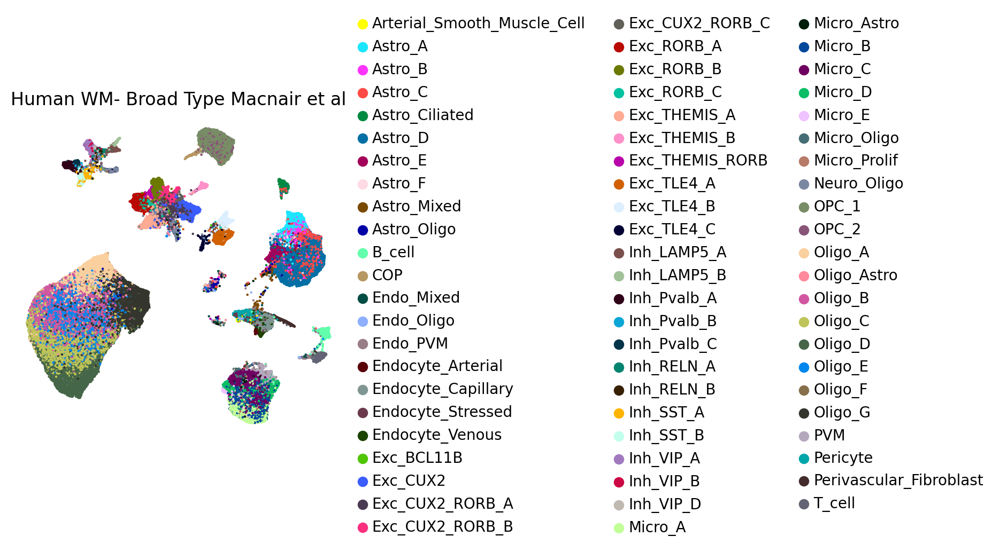

In [23]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['type_fine'], legend_fontsize =float(10) , wspace=0.6, 
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=10,
           title='Human WM- Broad Type Macnair et al',)
           #save='_Human_scVI_ALL_integration_broad_types_Mcnair.png')       

In [ ]:
cluster_simplified_color = {
    'OPCs + COPs': '#ff6699',
    'Oligodendrocytes': '#ff3399',
    'Microglia': '#0066ff',
    'Astrocytes': '#9AD255',
    'Inhibitory neurons': '#DA70D6',
    'Excitatory neurons': '#FF4500',
    'Endo + Peri': '#ffff66',
    'T cells': '#ff6666',
    'B cells': '#ff9933'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all[random_indices, :], color=['type_broad'], legend_fontsize =float(10) , wspace=0.6, 
           palette=cluster_simplified_color,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, s=10,
           title='Human WM- Broad Type Macnair et al',
           save='_Human_scVI_ALL_integration_broad_types_Mcnair_random.png')      

In [39]:
common_innate_immunity_human = ['IFI47', 'IIGP1', 'MDFIC', 'TOP2A', 'DYNLT1A', 'LGALS1', 
                                'CXCL10', 'OASL1', 'ZBP1', 'DHX58', 'TRIM25', 'RSAD2', 'SLFN9', 
                                'OAS1A', 'IFITM2', 'BCL3', 'IFI27L2A', 'OASL2',  'IRF7', 'IFIT1', 
                                'BST2', 'ISG15', 'IFIT3B', 'IFIT3', 'IFITM3', 'RTP4']

sc.tl.score_genes(adata_all, common_innate_immunity_human, score_name='common_innate_immunity_human')

computing score 'common_innate_immunity_human'
       'OASL2', 'IFIT3B'],
      dtype='object')
    finished: added
    'common_innate_immunity_human', score of gene set (adata.obs).
    549 total control genes are used. (0:00:52)


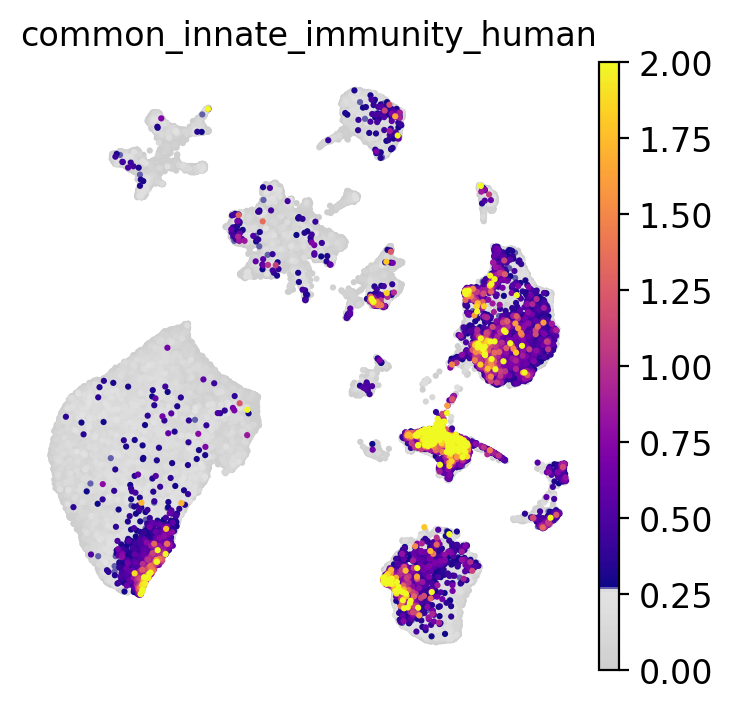

In [40]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['common_innate_immunity_human'],legend_fontsize =float(12), \
           cmap=mymap2, vmin=0, vmax=2, 
           legend_fontweight= 'normal', frameon= False, s=20, save='_Hs_innate_immunity_plot.png')

In [43]:
cupr_genes = ['SYT4', 'NUPR1','TENM4', 'TRIB3', 'MOXD1', 'GDF15', 'SLC7A5', 'CYB5R2', 'SOX2',
              'DNAL4', 'SMPD3', 'DDIT3', 'ATF4', 'EDA2R', 'COX20', 'CEBPG', 'CDH6',  
              'CHCHD10', 'FRMD4A', 'CD44', 'VEGFA', 'XYLT1', 'PTCH1', 'SMN1']

sc.tl.score_genes(adata_all, cupr_genes, score_name='Cupr_signature')

computing score 'Cupr_signature'
    finished: added
    'Cupr_signature', score of gene set (adata.obs).
    598 total control genes are used. (0:00:44)


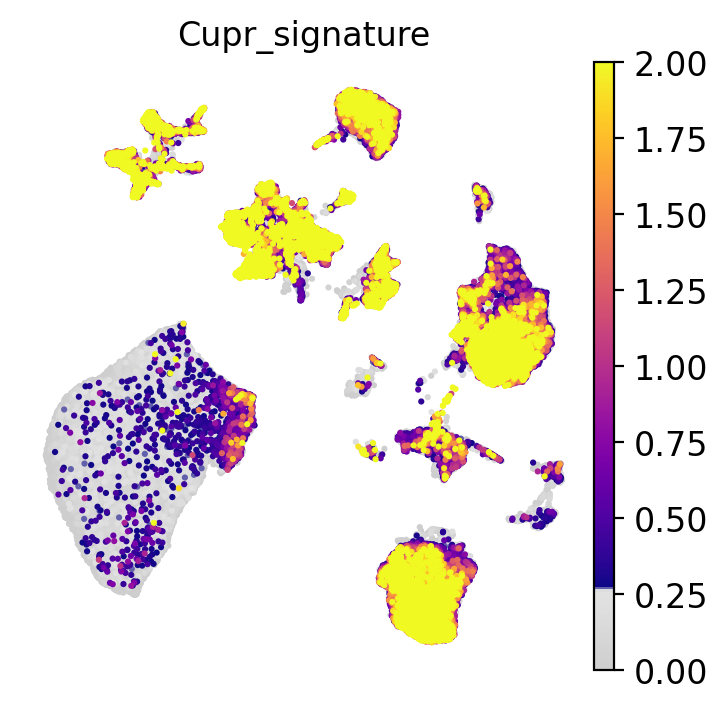

In [44]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['Cupr_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
           save='_hs_Cupr_DA_sig.png')

In [45]:
lpc_genes = ['KLK8', 'BCAN', 'STEAP3', 'SOX5', 'NRCAM', 'PLVAP', 'CHL1', 'NAV3',  
             'FGFRL1', 'SEMA4F', 'TSPAN4', 'AMOTL1', 'IFIT1', 'OASL2', 'PIEZO2', 'ANXA2',  
             'SOCS3', 'GBP3', 'MMD2', 'USP18', 'NPB', 'FAM124A', 'DDX60', 'BCL3',  
             'RALGPS2', 'PDZRN4', 'APBA2', 'IFI27L2A', 'C4B', 'NNAT', 'SNX10', 'RASIP1',  
             'CACHD1', 'MASP1', 'PARP3', 'KCNIP1', 'PROS1']

sc.tl.score_genes(adata_all, lpc_genes, score_name='LPC_signature')

computing score 'LPC_signature'
    finished: added
    'LPC_signature', score of gene set (adata.obs).
    599 total control genes are used. (0:00:25)


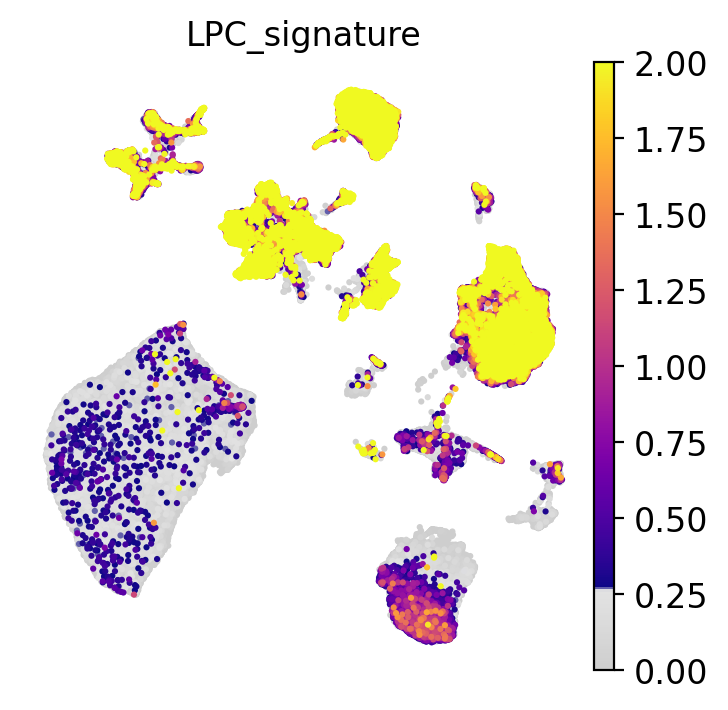

In [46]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_all, color=['LPC_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
           save='_hs_LPC_DA_sig.png')

In [5]:
adata= sc.read_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/scVI_mdata_OL_NEW.h5ad')
adata

AnnData object with n_obs × n_vars = 200872 × 27766
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC

In [7]:
common_innate_immunity_human = ['IFI47', 'IIGP1', 'MDFIC', 'TOP2A', 'DYNLT1A', 'LGALS1', 
                                'CXCL10', 'OASL1', 'ZBP1', 'DHX58', 'TRIM25', 'RSAD2', 'SLFN9', 
                                'OAS1A', 'IFITM2', 'BCL3', 'IFI27L2A', 'OASL2',  'IRF7', 'IFIT1', 
                                'BST2', 'ISG15', 'IFIT3B', 'IFIT3', 'IFITM3', 'RTP4']

sc.tl.score_genes(adata, common_innate_immunity_human, score_name='common_innate_immunity_human')

computing score 'common_innate_immunity_human'
       'OASL2', 'IFIT3B'],
      dtype='object')
    finished: added
    'common_innate_immunity_human', score of gene set (adata.obs).
    550 total control genes are used. (0:00:14)


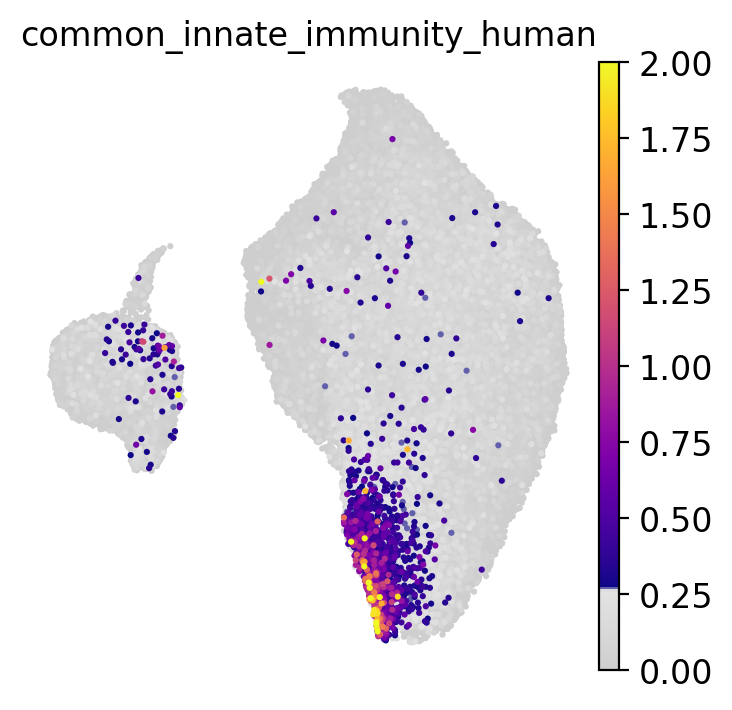

In [8]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['common_innate_immunity_human'],legend_fontsize =float(12), \
           cmap=mymap2, vmin=0, vmax=2, 
           legend_fontweight= 'normal', frameon= False, s=20)

In [14]:
cupr_genes = ['SYT4', 'NUPR1','TENM4', 'TRIB3', 'MOXD1', 'GDF15', 'SLC7A5', 'CYB5R2', 'SOX2',
              'DNAL4', 'SMPD3', 'DDIT3', 'ATF4', 'EDA2R', 'COX20', 'CEBPG', 'CDH6',  
              'CHCHD10', 'FRMD4A', 'CD44', 'VEGFA', 'XYLT1', 'PTCH1', 'SMN1']

sc.tl.score_genes(adata, cupr_genes, score_name='Cupr_signature')

computing score 'Cupr_signature'
    finished: added
    'Cupr_signature', score of gene set (adata.obs).
    750 total control genes are used. (0:00:14)


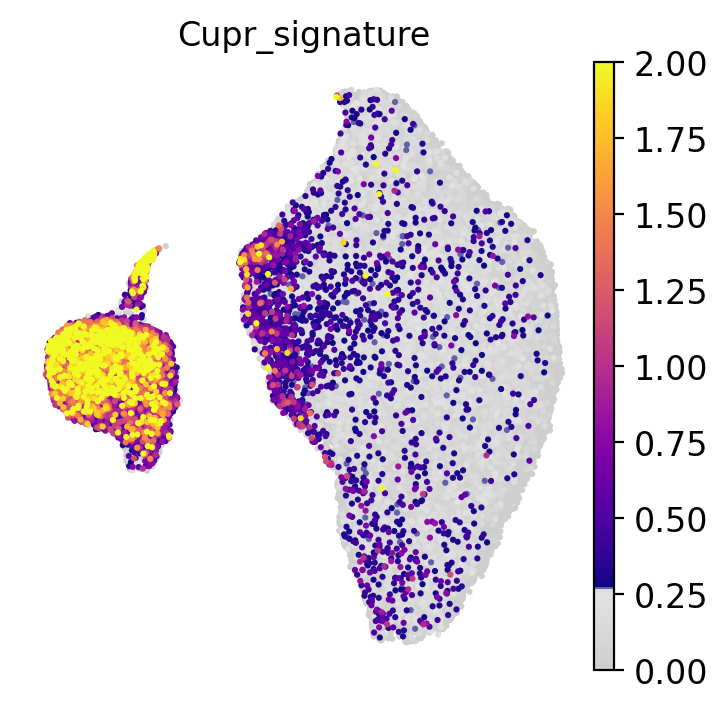

In [15]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['Cupr_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20)
          #save=today+'_Pandey_DA_sig.png')

In [12]:
lpc_genes = ['KLK8', 'BCAN', 'STEAP3', 'SOX5', 'NRCAM', 'PLVAP', 'CHL1', 'NAV3',  
             'FGFRL1', 'SEMA4F', 'TSPAN4', 'AMOTL1', 'IFIT1', 'OASL2', 'PIEZO2', 'ANXA2',  
             'SOCS3', 'GBP3', 'MMD2', 'USP18', 'NPB', 'FAM124A', 'DDX60', 'BCL3',  
             'RALGPS2', 'PDZRN4', 'APBA2', 'IFI27L2A', 'C4B', 'NNAT', 'SNX10', 'RASIP1',  
             'CACHD1', 'MASP1', 'PARP3', 'KCNIP1', 'PROS1']

sc.tl.score_genes(adata, lpc_genes, score_name='LPC_signature')

computing score 'LPC_signature'
    finished: added
    'LPC_signature', score of gene set (adata.obs).
    697 total control genes are used. (0:00:13)


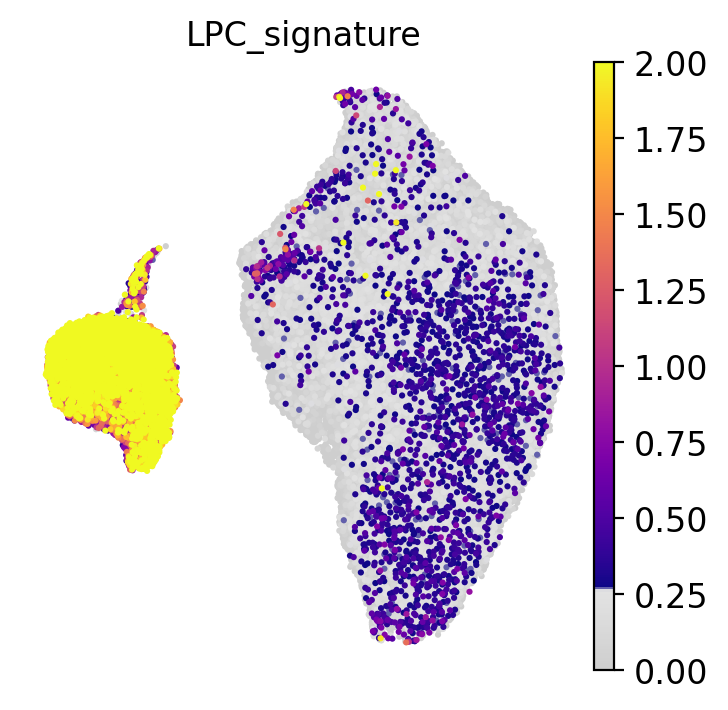

In [13]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['LPC_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20)
          #save=today+'_Pandey_DA_sig.png')

## MOL_5 outlier samples:

In [12]:
mol5_cells = adata.obs[adata.obs['OL_fine_type'] == 'MOL5'].copy()

print(len(mol5_cells))

# Count number of MOL5 cells per patient
mol5_counts = mol5_cells['sample_id_anon'].value_counts()

# Convert to a DataFrame for better visualization
mol5_counts_df = pd.DataFrame({'Patient_ID': mol5_counts.index, 'MOL5_Cell_Count': mol5_counts.values})

# Display the result
print(mol5_counts_df[:15])

6600

Patient_ID  MOL5_Cell_Count
0   Ind135-Sample1             1749
1   Ind144-Sample1             1144
2   Ind108-Sample4              502
3   Ind108-Sample5              490
4   Ind130-Sample3              438
5   Ind118-Sample3              401
6   Ind108-Sample1              237
7   Ind102-Sample4              113
8   Ind118-Sample2              113
9   Ind106-Sample2              101
10  Ind118-Sample4               72
11  Ind105-Sample1               69
12  Ind108-Sample3               67
13  Ind109-Sample3               62
14  Ind145-Sample1               62

In [13]:
# Compute quartiles and IQR
Q1 = np.percentile(mol5_counts, 25)
Q3 = np.percentile(mol5_counts, 75)
IQR = Q3 - Q1

# Compute outlier threshold
upper_threshold = Q3 + 1.5 * IQR

# Identify outliers
high_outliers = mol5_counts[mol5_counts > upper_threshold]

print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}")
print(f"Upper threshold for high outliers: {upper_threshold}")
print(f"High outliers: {high_outliers}")

Q1: 3.0, Q3: 35.0, IQR: 32.0

Upper threshold for high outliers: 83.0

High outliers: sample_id_anon
Ind135-Sample1    1749
Ind144-Sample1    1144
Ind108-Sample4     502
Ind108-Sample5     490
Ind130-Sample3     438
Ind118-Sample3     401
Ind108-Sample1     237
Ind102-Sample4     113
Ind118-Sample2     113
Ind106-Sample2     101
Name: count, dtype: int64

In [15]:
# Define the high outlier samples
high_outlier_samples = [
    "Ind135-Sample1", "Ind144-Sample1", "Ind108-Sample4", "Ind108-Sample5",
    "Ind130-Sample3", "Ind118-Sample3", "Ind108-Sample1", "Ind102-Sample4",
    "Ind118-Sample2", "Ind106-Sample2"
]

# Select relevant columns
columns_of_interest = [
    'sample_id_anon', 'individual_id_anon', 'lesion_type', 'diagnosis',
    'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes'
]

# Filter for high outlier samples and select columns
outlier_info = adata.obs.loc[adata.obs['sample_id_anon'].isin(high_outlier_samples), columns_of_interest]

# Drop duplicates (if multiple cells per sample)
outlier_info = outlier_info.drop_duplicates()

# Count number of MOL5 cells per sample
mol5_counts = adata.obs[adata.obs['OL_fine_type'] == 'MOL5']['sample_id_anon'].value_counts().reset_index()
mol5_counts.columns = ['sample_id_anon', 'MOL5_Cell_Count']

# Merge MOL5 counts with the metadata
outlier_info = outlier_info.merge(mol5_counts, on='sample_id_anon', how='left')

# Sort by the highest number of MOL5 cells
outlier_info = outlier_info.sort_values(by='MOL5_Cell_Count', ascending=False)

# Display table
print(outlier_info)

sample_id_anon individual_id_anon lesion_type diagnosis sex  age_at_death  \
7  Ind135-Sample1             Ind135          WM       CTR   F            85   
8  Ind144-Sample1             Ind144          WM       CTR   M            85   
2  Ind108-Sample4             Ind108          RL      SPMS   F            47   
3  Ind108-Sample5             Ind108        NAWM      SPMS   F            47   
6  Ind130-Sample3             Ind130         CAL      SPMS   F            41   
5  Ind118-Sample3             Ind118        NAWM      PPMS   M            66   
1  Ind108-Sample1             Ind108         CIL      SPMS   F            47   
4  Ind118-Sample2             Ind118          AL      PPMS   M            66   
9  Ind102-Sample4             Ind102         CAL      SPMS   M            64   
0  Ind106-Sample2             Ind106        NAWM      SPMS   M            62   

       smoker                      cause_of_death  years_w_ms  pmi_minutes  \
7     unknown                         dehydration -2147483648          280   
8     unknown  heart failure / prostate carcinoma -2147483648          255   
2     unknown                      ms, aspiration -2147483648          540   
3     unknown                      ms, aspiration -2147483648          540   
6     unknown                       natural death          12          505   
5      smoker                               ileus          26          450   
1     unknown                      ms, aspiration -2147483648          540   
4      smoker                               ileus          26          450   
9  non-smoker       terminal phase ms; spastic ms          34          450   
0     unknown                                  ms          18         1860   

   MOL5_Cell_Count  
7             1749  
8             1144  
2              502  
3              490  
6              438  
5              401  
1              237  
4              113  
9              113  
0              101

In [7]:
# Count the number of cells in each diagnosis condition
diagnosis_counts = adata.obs['c'].value_counts()

# Print the counts
print(diagnosis_counts)

diagnosis
SPMS    99458
PPMS    52087
CTR     43495
RRMS     5832
Name: count, dtype: int64

In [56]:
adata_all.write_h5ad('./scVI_human_allgenes_WORKING.h5ad')

In [57]:
adata_all

AnnData object with n_obs × n_vars = 321566 × 29040
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC